# Evidencia 1 - Proyecto Integrador

#### Patrick Galán Cárdenas - A01730687

#### Héctor San Román Caraza - A01422876

#### Luis Leopoldo Jiménez Pérez - A01275004

#### Jaime Guzmán Parada - A00827834

#### Iker Ledesma Durán - A01653115


## Parte 1: Correr instancias de TSP con 5, 7 y 10 ciudades y resolverlas con el algoritmo basado en colonia de hormigas (ACO).


 > iteration=1, best=3185
 > iteration=2, best=2889
 > iteration=3, best=2889
 > iteration=4, best=2889
 > iteration=5, best=2889
 > iteration=6, best=2889
 > iteration=7, best=2889
 > iteration=8, best=2889
 > iteration=9, best=2889
 > iteration=10, best=2889
 > iteration=11, best=2889
 > iteration=12, best=2889
 > iteration=13, best=2889
 > iteration=14, best=2889
 > iteration=15, best=2889
 > iteration=16, best=2889
 > iteration=17, best=2889
 > iteration=18, best=2889
 > iteration=19, best=2889
 > iteration=20, best=2889
 > iteration=21, best=2889
 > iteration=22, best=2889
 > iteration=23, best=2889
 > iteration=24, best=2889
 > iteration=25, best=2889
 > iteration=26, best=2889
 > iteration=27, best=2889
 > iteration=28, best=2889
 > iteration=29, best=2889
 > iteration=30, best=2889
 > iteration=31, best=2889
 > iteration=32, best=2889
 > iteration=33, best=2889
 > iteration=34, best=2889
 > iteration=35, best=2889
 > iteration=36, best=2889
 > iteration=37, best=2889
 > iterati

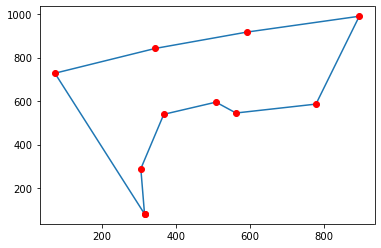

In [65]:
# CLEVER ALGORITHM: Ant System
# Author: Santiago E. Conant-Pablos, October 14, 2015

import math
import numpy as np
import matplotlib.pyplot as plt

def euc_2d(c1, c2):
    """returns the rounded Euclidian distance between two 2D points"""
    return round(math.sqrt(sum((c1-c2) ** 2.0)))
    
def cost(permutation, cities):
    """returns the length of a tour of cities"""
    distance = 0
    ncities = len(cities)
    for i in range(ncities):
        c1 = permutation[i]
        if i+1 == ncities:
            c2 = permutation[0]
        else:
            c2 = permutation[i+1]
        distance += euc_2d(cities[c1], cities[c2])
    return distance

def random_permutation(cities):
    """generate a tour as a random permutation of cities"""
    perm = list(range(len(cities)))
    np.random.shuffle(perm)
    return perm

def initialise_pheromone_matrix(num_cities, naive_score):
    """initialises the pheromone matrix"""
    v = num_cities / naive_score
    return v * np.ones(num_cities*num_cities).reshape((num_cities,num_cities))

def calculate_choices(cities, last_city, exclude, pheromone, c_heur, c_hist):
    """calculate the selection probability for a group of cities"""
    choices = []
    for i,coord in enumerate(cities):
        if i in exclude: continue
        prob = {'city' : i}
        prob['history'] = pheromone[last_city, i] ** c_hist
        prob['distance'] = euc_2d(cities[last_city], coord)
        prob['heuristic'] = (1.0 / prob['distance']) ** c_heur
        prob['prob'] = prob['history'] * prob['heuristic']
        choices.append(prob)
    return choices
        
def select_next_city(choices):
    """selects the next city for a partial tour"""
    psum = 0.0
    for element in choices: psum += element['prob']
    if psum == 0.0:
        return choices[np.random.randint(len(choices))]['city']
    v = np.random.random()
    for i,choice in enumerate(choices):
        v -= choice['prob'] / psum
        if v <= 0.0: return choice['city']
    return choices[-1]['city']

def stepwise_const(cities, phero, c_heur, c_hist):
    """construct a tour for an ant"""
    ncities = len(cities)
    perm = []
    perm.append(np.random.randint(ncities))
    while len(perm) < ncities:
        choices = calculate_choices(cities, perm[-1], perm, phero, c_heur, c_hist)
        next_city = select_next_city(choices)
        perm.append(next_city)
    return perm

def decay_pheromone(pheromone, decay_factor):
    """reduce all the pheromone values"""
    factor = 1.0 - decay_factor
    for i in range(len(pheromone)):
        for j in range(len(pheromone[0])):
            pheromone[i, j] *= factor
    
def update_pheromone(pheromone, solutions):
    """increase the pheromone values in the ants tours"""
    for other in solutions:
        for i,x in enumerate(other['vector']):
            if i == len(other['vector'])-1:
                y = other['vector'][0]
            else:
                y = other['vector'][i+1]
            pheromone[x,y] += 1.0 / other['cost']
            pheromone[y,x] += 1.0 / other['cost']

def draw_tour(tour, cities):
    """draws a plot of the tour"""
    xp = [cities[c,0] for c in tour] + [cities[tour[0],0]]
    yp = [cities[c,1] for c in tour] + [cities[tour[0],1]]
    plt.cla()
    plt.plot(xp,yp, xp,yp, 'ro')
    fig.canvas.draw()
    
def ant_system(cities, max_it, num_ants, decay_factor, c_heur, c_hist):
    """implements an Ant System"""
    best = {'vector' : random_permutation(cities)}
    best['cost'] = cost(best['vector'], cities)
    pheromone = initialise_pheromone_matrix(len(cities), best['cost'])
    draw_tour(best['vector'], cities)
    for i in range(max_it):
        solutions = []
        for ant in range(num_ants):
            candidate = {}
            candidate['vector'] = stepwise_const(cities, pheromone, c_heur, c_hist)
            candidate['cost'] = cost(candidate['vector'], cities)
            if candidate['cost'] < best['cost']:
                best = candidate
                draw_tour(best['vector'], cities)
            solutions.append(candidate)
        decay_pheromone(pheromone, decay_factor)
        update_pheromone(pheromone, solutions)
        print(" > iteration=%d, best=%g" % (i+1,best['cost']))
    return best

# problem configuration
# Taken from TSPLIB with Optimal solution = 7542 units
berlin52 = np.array([[591,917],[315,81],[895,990],[508,595],[367,539],
            [73,728],[344,842],[778,586],[562,545],[305,289]],float)  # En este apartado hay que eliminar o agregar el número de ciudades para poder evaluar el desempeño con 5, 7 y 10 ciudades
# algorithm configuration
max_it = 50 # maximum number of iterations
num_ants = 30  # number of ants
decay_factor = 0.6 # reduction of pheromone
c_heur = 2.5 # heuristic coefficient
c_hist = 1.0 # pheromone coefficient
# execute the algorithm
plt.ion()
fig = plt.figure()
best = ant_system(berlin52, max_it, num_ants, decay_factor, c_heur, c_hist)
print("Done.\nBest Solution: c=%g, v=%s" % (best['cost'], best['vector']))
plt.ioff()
#plt.show()


## Parte 2:  Correr las mismas instancias de TSP y resolverlas con el algoritmo PSO.

In [1]:
import math
import random
import matplotlib.pyplot as plt


class City:
    def __init__(self, x, y):
        self.x = x
        self.y = y

    def distance(self, city):
        return math.hypot(self.x - city.x, self.y - city.y)

    def __repr__(self):
        return f"({self.x}, {self.y})"


def read_cities(size):
    cities = []
    with open(f'cities_{size}.data', 'r') as handle: #De momento el archivo de 'cities_64.data' es donde se encuentran las ciudades y por lo tanto hay que editar dicho archivo para evaluar el desempeño con distinto número de ciudades
        lines = handle.readlines()
        for line in lines:
            x, y = map(float, line.split())
            cities.append(City(x, y))
    return cities


def write_cities_and_return_them(size):
    cities = generate_cities(size)
    with open(f'cities_64.data', 'w+') as handle:
        for city in cities:
            handle.write(f'{city.x} {city.y}\n')
    return cities


def generate_cities(size):
    return [City(x=int(random.random() * 1000), y=int(random.random() * 1000)) for _ in range(size)]


def path_cost(route):
    return sum([city.distance(route[index - 1]) for index, city in enumerate(route)])


def visualize_tsp(title, cities):
    fig = plt.figure()
    fig.suptitle(title)
    x_list, y_list = [], []
    for city in cities:
        x_list.append(city.x)
        y_list.append(city.y)
    x_list.append(cities[0].x)
    y_list.append(cities[0].y)

    plt.plot(x_list, y_list, 'ro')
    plt.plot(x_list, y_list, 'g')
    plt.show(block=True)


initial cost is 3436.0647400271314


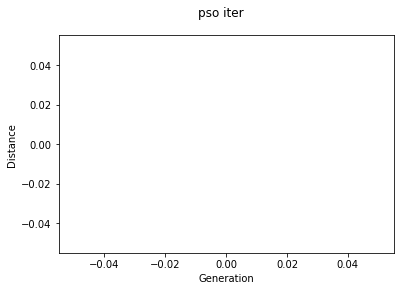

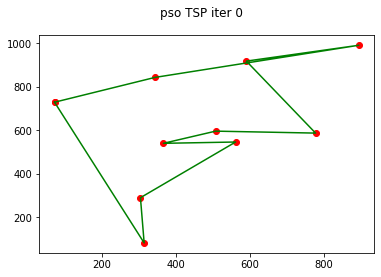

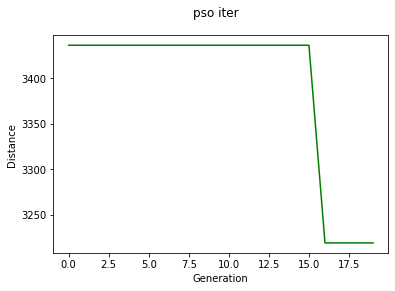

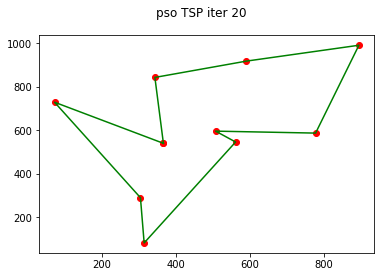

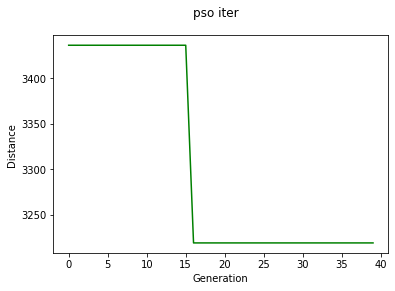

...

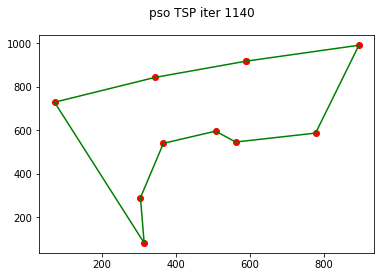

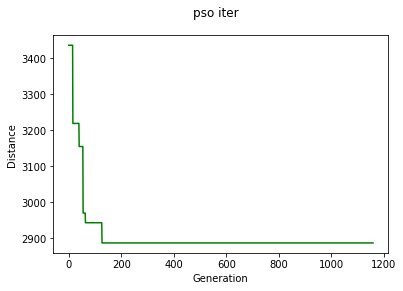

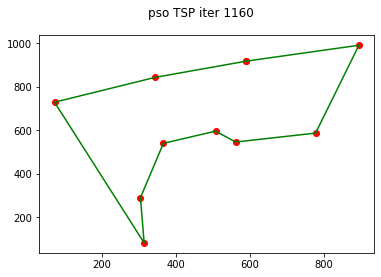

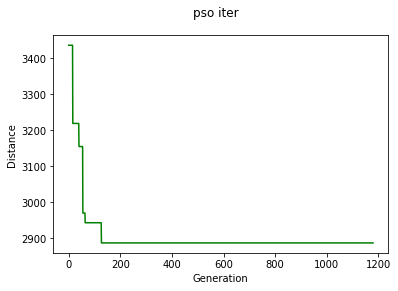

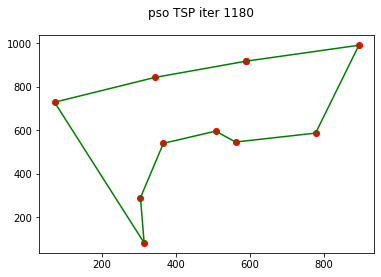

cost: 2887.134482958302	| gbest: [(591.0, 917.0), (895.0, 990.0), (778.0, 586.0), (562.0, 545.0), (508.0, 595.0), (367.0, 539.0), (305.0, 289.0), (315.0, 81.0), (73.0, 728.0), (344.0, 842.0)]


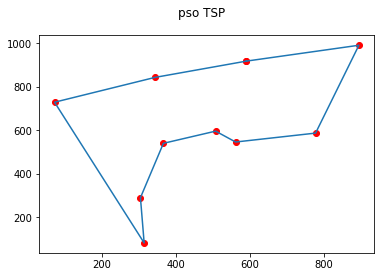

In [2]:
import random
import math
import matplotlib.pyplot as plt


class Particle:
    def __init__(self, route, cost=None):
        self.route = route
        self.pbest = route
        self.current_cost = cost if cost else self.path_cost()
        self.pbest_cost = cost if cost else self.path_cost()
        self.velocity = []

    def clear_velocity(self):
        self.velocity.clear()

    def update_costs_and_pbest(self):
        self.current_cost = self.path_cost()
        if self.current_cost < self.pbest_cost:
            self.pbest = self.route
            self.pbest_cost = self.current_cost

    def path_cost(self):
        return path_cost(self.route)


class PSO:

    def __init__(self, iterations, population_size, gbest_probability=1.0, pbest_probability=1.0, cities=None):
        self.cities = cities
        self.gbest = None
        self.gcost_iter = []
        self.iterations = iterations
        self.population_size = population_size
        self.particles = []
        self.gbest_probability = gbest_probability
        self.pbest_probability = pbest_probability

        solutions = self.initial_population()
        self.particles = [Particle(route=solution) for solution in solutions]

    def random_route(self):
        return random.sample(self.cities, len(self.cities))

    def initial_population(self):
        random_population = [self.random_route() for _ in range(self.population_size - 1)]
        greedy_population = [self.greedy_route(0)]
        return [*random_population, *greedy_population]
        # return [*random_population]

    def greedy_route(self, start_index):
        unvisited = self.cities[:]
        del unvisited[start_index]
        route = [self.cities[start_index]]
        while len(unvisited):
            index, nearest_city = min(enumerate(unvisited), key=lambda item: item[1].distance(route[-1]))
            route.append(nearest_city)
            del unvisited[index]
        return route

    def run(self):
        self.gbest = min(self.particles, key=lambda p: p.pbest_cost)
        print(f"initial cost is {self.gbest.pbest_cost}")
        plt.ion()
        plt.draw()
        for t in range(self.iterations):
            self.gbest = min(self.particles, key=lambda p: p.pbest_cost)
            if t % 20 == 0:
                plt.figure(0)
                plt.plot(pso.gcost_iter, 'g')
                plt.ylabel('Distance')
                plt.xlabel('Generation')
                fig = plt.figure(0)
                fig.suptitle('pso iter')
                x_list, y_list = [], []
                for city in self.gbest.pbest:
                    x_list.append(city.x)
                    y_list.append(city.y)
                x_list.append(pso.gbest.pbest[0].x)
                y_list.append(pso.gbest.pbest[0].y)
                fig = plt.figure(1)
                fig.clear()
                fig.suptitle(f'pso TSP iter {t}')

                plt.plot(x_list, y_list, 'ro')
                plt.plot(x_list, y_list, 'g')
                plt.draw()
                plt.pause(.001)
            self.gcost_iter.append(self.gbest.pbest_cost)

            for particle in self.particles:
                particle.clear_velocity()
                temp_velocity = []
                gbest = self.gbest.pbest[:]
                new_route = particle.route[:]

                for i in range(len(self.cities)):
                    if new_route[i] != particle.pbest[i]:
                        swap = (i, particle.pbest.index(new_route[i]), self.pbest_probability)
                        temp_velocity.append(swap)
                        new_route[swap[0]], new_route[swap[1]] = \
                            new_route[swap[1]], new_route[swap[0]]

                for i in range(len(self.cities)):
                    if new_route[i] != gbest[i]:
                        swap = (i, gbest.index(new_route[i]), self.gbest_probability)
                        temp_velocity.append(swap)
                        gbest[swap[0]], gbest[swap[1]] = gbest[swap[1]], gbest[swap[0]]

                particle.velocity = temp_velocity

                for swap in temp_velocity:
                    if random.random() <= swap[2]:
                        new_route[swap[0]], new_route[swap[1]] = \
                            new_route[swap[1]], new_route[swap[0]]

                particle.route = new_route
                particle.update_costs_and_pbest()


if __name__ == "__main__":
    cities = read_cities(64)
    pso = PSO(iterations=1200, population_size=300, pbest_probability=0.9, gbest_probability=0.02, cities=cities)
    pso.run()
    print(f'cost: {pso.gbest.pbest_cost}\t| gbest: {pso.gbest.pbest}')

    x_list, y_list = [], []
    for city in pso.gbest.pbest:
        x_list.append(city.x)
        y_list.append(city.y)
    x_list.append(pso.gbest.pbest[0].x)
    y_list.append(pso.gbest.pbest[0].y)
    fig = plt.figure(1)
    fig.suptitle('pso TSP')

    plt.plot(x_list, y_list, 'ro')
    plt.plot(x_list, y_list)
    plt.show(block=True)

# Parte 3:  Comparación del punto 1 y punto 2

El primer código de Optimización de Colonia de Hormigas (por sus siglas en inglés ACO)  muestra un muy buen desempeño ya que no toma bastantes recursos computacionales en encontrar la ruta más óptima, además que muestra un buen costo final, por lo que se mostró efectivo en todas las iteracioones de 5, 7 y 10 ciudades.  Por otro lado, el código de Optimización por enjambre de partículas (PSO) a pesar de que, mientras se mantenga la misma lista de ciudades, obtener un ruta final idéntica a la de ACO y un costo mínimamente menor, esta muestra en una mayor cantidad de tiempo los resultados finales, ya que en total hace 1180 iteraciones, y aunque este número de iteraciones ayuda a obtener un resultado bastante preciso, require de una considerable cantidad de recursos para poder llegar a los resultados deseados.  Por lo tanto, para este escenario el ACO muestra ser una mejor alternativa que al PSO.  Quizás para un mayor número de ciudades el PSO pueda ser la alternativa más adecuada. 

# Parte 4: Estudiar la optimización de una función matemática usando el algoritmo PSO.

In [22]:
import numpy as np
import random
import warnings
import random
import copy
import pandas as pd
import time
import matplotlib
import matplotlib.pyplot as plt
from datetime import datetime

In [23]:
import warnings
warnings.filterwarnings('ignore')

### Clase partícula

In [24]:
class Particula:
    """Esta clase representa nueva partícula con una posición inicial definida por
    una combinación de valores numéricos aleatorios y velocidad de 0. El rango
    de posibles valores para cada variable (posición) puede estar acotado. Al
    crear una nueva partícula, solo se dispone de información sobre su posición 
    inicial y velocidad, el resto de atributos están vacíos.
    
    Parameters
    ----------
    n_variables : `int`
        número de variables que definen la posición de la partícula.
        
    limites_inf : `list` or `numpy.ndarray`, optional
        límite inferior de cada variable. Si solo se quiere predefinir límites
        de alguna variable, emplear ``None``. Los ``None`` serán remplazados
        por el valor (-10**3). (default is ``None``)
        
    limites_sup : `list` or `numpy.ndarray`, optional
        límite superior de cada variable. Si solo se quiere predefinir límites
        de alguna variable, emplear ``None``. Los ``None`` serán remplazados
        por el valor (+10**3). (default is ``None``)

    verbose : `bool`, optional
        mostrar información de la partícula creada. (default is ``False``)

    Attributes
    ----------
    n_variables : `int`
        número de variables que definen la posición de la partícula.

    limites_inf : `list` or `numpy.ndarray`
        límite inferior de cada variable. Si solo se quiere predefinir límites
        de alguna variable, emplear ``None``. Los ``None`` serán remplazados por
        el valor (-10**3).

    limites_sup : `list` or `numpy.ndarray`
        límite superior de cada variable. Si solo se quiere predefinir límites
        de alguna variable, emplear ``None``. Los``None`` serán remplazados por
        el valor (+10**3).

    mejor_valor : `numpy.ndarray`
        mejor valor que ha tenido la partícula hasta el momento.

    mejor_posicion : `numpy.ndarray`
        posición en la que la partícula ha tenido el mejor valor hasta el momento.

    valor : `float`
        valor actual de la partícula. Resultado de evaluar la función objetivo
        con la posición actual.

    velocidad : `numpy.ndarray`
        array con la velocidad actual de la partícula.

    Raises
    ------
    raise Exception
        si `limites_inf` es distinto de None y su longitud no coincide con
        `n_variables`.

    raise Exception
        si `limites_sup` es distinto de None y su longitud no coincide con
        `n_variables`.

    Examples
    --------
    Ejemplo creación partícula.

    >>> part = Particula(
                    n_variables = 3,
                    limites_inf = [4,10,20],
                    limites_sup = [-1,2,0],
                    verbose     = True
                    )

    """
    
    def __init__(self, n_variables, limites_inf=None, limites_sup=None,
                 verbose=False):

        # Número de variables de la partícula
        self.n_variables = n_variables
        # Límite inferior de cada variable
        self.limites_inf = limites_inf
        # Límite superior de cada variable
        self.limites_sup = limites_sup
        # Posición de la partícula
        self.posicion = np.repeat(None, n_variables)
        # Velocidad de la parícula
        self.velocidad = np.repeat(None, n_variables)
        # Valor de la partícula
        self.valor = np.repeat(None, 1)
        # Mejor valor que ha tenido la partícula hasta el momento
        self.mejor_valor = None
        # Mejor posición en la que ha estado la partícula hasta el momento
        self.mejor_posicion = None
        
        # CONVERSIONES DE TIPO INICIALES
        # ----------------------------------------------------------------------
        # Si limites_inf o limites_sup no son un array numpy, se convierten en
        # ello.
        if self.limites_inf is not None \
        and not isinstance(self.limites_inf,np.ndarray):
            self.limites_inf = np.array(self.limites_inf)

        if self.limites_sup is not None \
        and not isinstance(self.limites_sup,np.ndarray):
            self.limites_sup = np.array(self.limites_sup)
        
        # COMPROBACIONES INICIALES: EXCEPTIONS Y WARNINGS
        # ----------------------------------------------------------------------
        if self.limites_inf is not None \
        and len(self.limites_inf) != self.n_variables:
            raise Exception(
                "limites_inf debe tener un valor por cada variable. " +
                "Si para alguna variable no se quiere límite, emplear None. " +
                "Ejemplo: limites_inf = [10, None, 5]"
                )
        elif self.limites_sup is not None \
        and len(self.limites_sup) != self.n_variables:
            raise Exception(
                "limites_sup debe tener un valor por cada variable. " +
                "Si para alguna variable no se quiere límite, emplear None. " +
                "Ejemplo: limites_sup = [10, None, 5]"
                )
        elif (self.limites_inf is None) or (self.limites_sup is None):
            warnings.warn(
                "Es altamente recomendable indicar los límites dentro de los " + 
                "cuales debe buscarse la solución de cada variable. " + 
                "Por defecto se emplea [-10^3, 10^3]."
                )
        elif any(np.concatenate((self.limites_inf, self.limites_sup)) == None):
            warnings.warn(
                "Los límites empleados por defecto cuando no se han definido " +
                "son: [-10^3, 10^3]."
            )

        # COMPROBACIONES INICIALES: ACCIONES
        # ----------------------------------------------------------------------

        # Si no se especifica limites_inf, el valor mínimo que pueden tomar las 
        # variables es -10^3.
        if self.limites_inf is None:
            self.limites_inf = np.repeat(-10**3, self.n_variables)

        # Si no se especifica limites_sup, el valor máximo que pueden tomar las 
        # variables es 10^3.
        if self.limites_sup is None:
             self.limites_sup = np.repeat(+10**3, self.n_variables)
            
        # Si los límites no son nulos, se reemplazan aquellas posiciones None por
        # el valor por defecto -10^3 y 10^3.
        if self.limites_inf is not None:
            self.limites_inf[self.limites_inf == None] = -10**3
           
        if self.limites_sup is not None:
            self.limites_sup[self.limites_sup == None] = +10**3
        
        # BUCLE PARA ASIGNAR UN VALOR A CADA UNA DE LAS VARIABLES QUE DEFINEN LA
        # POSICIÓN
        # ----------------------------------------------------------------------
        for i in np.arange(self.n_variables):
        # Para cada posición, se genera un valor aleatorio dentro del rango
        # permitido para esa variable.
            self.posicion[i] = random.uniform(
                                    self.limites_inf[i],
                                    self.limites_sup[i]
                                )

        # LA VELOCIDAD INICIAL DE LA PARTÍCULA ES 0
        # ----------------------------------------------------------------------
        self.velocidad = np.repeat(0, self.n_variables)

        # INFORMACIÓN DEL PROCESO (VERBOSE)
        # ----------------------------------------------------------------------
        if verbose:
            print("Nueva partícula creada")
            print("----------------------")
            print("Posición: " + str(self.posicion))
            print("Límites inferiores de cada variable: " \
                  + str(self.limites_inf))
            print("Límites superiores de cada variable: " \
                  + str(self.limites_sup))
            print("Velocidad: " + str(self.velocidad))
            print("")

    def __repr__(self):
        """
        Información que se muestra cuando se imprime un objeto partícula.

        """

        texto = "Partícula" \
                + "\n" \
                + "---------" \
                + "\n" \
                + "Posición: " + str(self.posicion) \
                + "\n" \
                + "Velocidad: " + str(self.velocidad) \
                + "\n" \
                + "Mejor posicion: " + str(self.mejor_posicion) \
                + "\n" \
                + "Mejor valor: " + str(self.mejor_valor) \
                + "\n" \
                + "Límites inferiores de cada variable: " \
                + str(self.limites_inf) \
                + "\n" \
                + "Límites superiores de cada variable: " \
                + str(self.limites_sup) \
                + "\n"

        return(texto)

    def evaluar_particula(self, funcion_objetivo, optimizacion, verbose = False):
        """Este método evalúa una partícula calculando el valor que toma la
        función objetivo en la posición en la que se encuentra. Además, compara
        si la nueva posición es mejor que las anteriores. Modifica los atributos
        valor, mejor_valor y mejor_posicion de la partícula.
        
        Parameters
        ----------
        funcion_objetivo : `function`
            función que se quiere optimizar.

        optimizacion : {'maximizar', 'minimizar'}
            dependiendo de esto, el mejor valor histórico de la partícula será
            el mayor o el menor valor que ha tenido hasta el momento.

        verbose : `bool`, optional
            mostrar información del proceso por pantalla. (default is ``False``)
          
        Raises
        ------
        raise Exception
            si el argumento `optimizacion` es distinto de 'maximizar' o 'minimizar'

        Examples
        --------
        Ejemplo evaluar partícula con una función objetivo.

        >>> part = Particula(
                n_variables = 3,
                limites_inf = [4,10,20],
                limites_sup = [-1,2,None],
                verbose     = True
                )

        >>> def funcion_objetivo(x_0, x_1, x_2):
                f= x_0**2 + x_1**2 + x_2**2
                return(f)

        >>> part.evaluar_particula(
                funcion_objetivo = funcion_objetivo,
                optimizacion     = "maximizar",
                verbose          = True
                )

        """

        # COMPROBACIONES INICIALES: EXCEPTIONS Y WARNINGS
        # ----------------------------------------------------------------------
        if not optimizacion in ["maximizar", "minimizar"]:
            raise Exception(
                "El argumento optimizacion debe ser: maximizar o minimizar"
                )

        # EVALUACIÓN DE LA FUNCIÓN OBJETIVO EN LA POSICIÓN ACTUAL
        # ----------------------------------------------------------------------
        self.valor = funcion_objetivo(*self.posicion)

        # MEJOR VALOR Y POSICIÓN
        # ----------------------------------------------------------------------
        # Se compara el valor actual con el mejor valor histórico. La comparación
        # es distinta dependiendo de si se desea maximizar o minimizar.
        # Si no existe ningún valor histórico, se almacena el actual. Si ya existe
        # algún valor histórico se compara con el actual y, de ser mejor este
        # último, se sobrescribe.
        
        if self.mejor_valor is None:
            self.mejor_valor    = np.copy(self.valor)
            self.mejor_posicion = np.copy(self.posicion)
        else:
            if optimizacion == "minimizar":
                if self.valor < self.mejor_valor:
                    self.mejor_valor    = np.copy(self.valor)
                    self.mejor_posicion = np.copy(self.posicion)
            else:
                if self.valor > self.mejor_valor:
                    self.mejor_valor    = np.copy(self.valor)
                    self.mejor_posicion = np.copy(self.posicion)

        # INFORMACIÓN DEL PROCESO (VERBOSE)
        # ----------------------------------------------------------------------
        if verbose:
            print("La partícula ha sido evaluada")
            print("-----------------------------")
            print("Valor actual: " + str(self.valor))
            print("")

    def mover_particula(self, mejor_p_enjambre, inercia=0.8, peso_cognitivo=2,
                        peso_social=2, verbose=False):
        """
        Este método ejecuta el movimiento de una partícula, lo que implica
        actualizar su velocidad y posición. No se permite que la partícula
        salga de la zona de búsqueda acotada por los límites.
        
        Parameters
        ----------
        mejor_p_enjambre : `np.narray`
            mejor posición de todo el enjambre.

        inercia : `float`, optional
            coeficiente de inercia. (default is 0.8)

        peso_cognitivo : `float`, optional
            coeficiente cognitivo. (default is 2)

        peso_social : `float`, optional
            coeficiente social. (default is 2)

        verbose : `bool`, optional
            mostrar información de la partícula creada. (default is ``False``)
          
        Examples
        --------
        Ejemplo mover partícula.

        >>> part = Particula(
                n_variables = 3,
                limites_inf = [4,10,20],
                limites_sup = [-1,2,None],
                verbose     = True
                )

        >>> def funcion_objetivo(x_0, x_1, x_2):
                f= x_0**2 + x_1**2 + x_2**2
                return(f)

        >>> part.evaluar_particula(
                funcion_objetivo = funcion_objetivo,
                optimizacion     = "maximizar",
                verbose          = True
                )

        >>> part.mover_particula(
                mejor_p_enjambre = np.array([-1000,-1000,+1000]),
                inercia          = 0.8,
                peso_cognitivo   = 2,
                peso_social      = 2,
                verbose          = True
                )
       
        """

        # ACTUALIZACIÓN DE LA VELOCIDAD
        # ----------------------------------------------------------------------
        componente_velocidad = inercia * self.velocidad
        r1 = np.random.uniform(low=0.0, high=1.0, size = len(self.velocidad))
        r2 = np.random.uniform(low=0.0, high=1.0, size = len(self.velocidad))
        componente_cognitivo = peso_cognitivo * r1 * (self.mejor_posicion \
                                                      - self.posicion)
        componente_social = peso_social * r2 * (mejor_p_enjambre \
                                                - self.posicion)
        nueva_velocidad = componente_velocidad + componente_cognitivo \
                          + componente_social
        self.velocidad = np.copy(nueva_velocidad)
        
        # ACTUALIZACIÓN DE LA POSICIÓN
        # ----------------------------------------------------------------------
        self.posicion = self.posicion + self.velocidad

        # COMPROBAR LÍMITES
        # ----------------------------------------------------------------------
        # Se comprueba si algún valor de la nueva posición supera los límites
        # impuestos. En tal caso, se sobrescribe con el valor del límite
        # correspondiente y se reinicia a 0 la velocidad de la partícula en esa
        # componente.
        for i in np.arange(len(self.posicion)):
            if self.posicion[i] < self.limites_inf[i]:
                self.posicion[i] = self.limites_inf[i]
                self.velocidad[i] = 0

            if self.posicion[i] > self.limites_sup[i]:
                self.posicion[i] = self.limites_sup[i]
                self.velocidad[i] = 0
                
        # INFORMACIÓN DEL PROCESO (VERBOSE)
        # ----------------------------------------------------------------------
        if verbose:
            print("La partícula se ha desplazado")
            print("-----------------------------")
            print("Nueva posición: " + str(self.posicion))
            print("")

### Clase enjambre

In [25]:
class Enjambre:
    """
    Esta clase crea un enjambre de n partículas. El rango de posibles valores
    para cada variable (posición) puede estar acotado.

    Parameters
    ----------
    n_particulas :`int`
        número de partículas del enjambre.

    n_variables : `int`
        número de variables que definen la posición de las partícula.

    limites_inf : `list` or `numpy.ndarray`
        límite inferior de cada variable. Si solo se quiere predefinir límites
        de alguna variable, emplear ``None``. Los ``None`` serán remplazados por
        el valor (-10**3).

    limites_sup : `list` or `numpy.ndarray`
        límite superior de cada variable. Si solo se quiere predefinir límites
        de alguna variable, emplear ``None``. Los``None`` serán remplazados por
        el valor (+10**3).

    verbose : `bool`, optional
        mostrar información de la partícula creada. (default is ``False``)

    Attributes
    ----------
    partículas : `list`
        lista con todas las partículas del enjambre.
    
    n_particulas :`int`
        número de partículas del enjambre.

    n_variables : `int`
        número de variables que definen la posición de las partícula.

    limites_inf : `list` or `numpy.ndarray`
        límite inferior de cada variable.

    limites_sup : `list` or `numpy.ndarray`
        límite superior de cada variable.

    mejor_particula : `object particula`
        la mejor partícula del enjambre en estado actual.

    mejor_valor : `floar`
        el mejor valor del enjambre en su estado actual.

    historico_particulas : `list`
        lista con el estado de las partículas en cada una de las iteraciones que
        ha tenido el enjambre.

    historico_mejor_posicion : `list`
        lista con la mejor posición en cada una de las iteraciones que ha tenido
        el enjambre.

    historico_mejor_valor : `list`
        lista con el mejor valor en cada una de las iteraciones que ha tenido el
        enjambre.

    diferencia_abs : `list`
        diferencia absoluta entre el mejor valor de iteraciones consecutivas.

    resultados_df : `pandas.core.frame.DataFrame`
        dataframe con la información del mejor valor y posición encontrado en
        cada iteración, así como la mejora respecto a la iteración anterior.

    valor_optimo : `float`
        mejor valor encontrado en todas las iteraciones.

    posicion_optima : `numpy.narray`
        posición donde se ha encontrado el valor_optimo.

    optimizado : `bool`
        si el enjambre ha sido optimizado.

    iter_optimizacion : `int`
        número de iteraciones de optimizacion.

    verbose : `bool`, optional
        mostrar información de la partícula creada. (default is ``False``)

    Examples
    --------
    Ejemplo crear enjambre

    >>> enjambre = Enjambre(
               n_particulas = 5,
               n_variables  = 3,
               limites_inf  = [-5,-5,-5],
               limites_sup  = [5,5,5],
               verbose      = True
            )

    """

    def __init__(self, n_particulas, n_variables, limites_inf = None,
                 limites_sup = None, verbose = False):

        # Número de partículas del enjambre
        self.n_particulas = n_particulas
        # Número de variables de cada partícula
        self.n_variables = n_variables
        # Límite inferior de cada variable
        self.limites_inf = limites_inf
        # Límite superior de cada variable
        self.limites_sup = limites_sup
        # Verbose
        self.verbose = verbose
        # Lista de las partículas del enjambre
        self.particulas = []
        # Etiqueta para saber si el enjambre ha sido optimizado
        self.optimizado = False
        # Número de iteraciones de optimización llevadas a cabo
        self.iter_optimizacion = None
        # Mejor partícula del enjambre
        self.mejor_particula = None
        # Mejor valor del enjambre
        self.mejor_valor = None
        # Posición del mejor valor del enjambre.
        self.mejor_posicion = None
        # Estado de todas las partículas del enjambre en cada iteración.
        self.historico_particulas = []
        # Mejor posición en cada iteración.
        self.historico_mejor_posicion = []
        # Mejor valor en cada iteración.
        self.historico_mejor_valor = []
        # Diferencia absoluta entre el mejor valor de iteraciones consecutivas.
        self.diferencia_abs = []
        # data.frame con la información del mejor valor y posición encontrado en
        # cada iteración, así como la mejora respecto a la iteración anterior.
        self.resultados_df = None
        # Mejor valor de todas las iteraciones
        self.valor_optimo = None
        # Mejor posición de todas las iteraciones
        self.posicion_optima = None

        # CONVERSIONES DE TIPO INICIALES
        # ----------------------------------------------------------------------
        # Si limites_inf o limites_sup no son un array numpy, se convierten en
        # ello.
        if self.limites_inf is not None \
        and not isinstance(self.limites_inf,np.ndarray):
            self.limites_inf = np.array(self.limites_inf)

        if self.limites_sup is not None \
        and not isinstance(self.limites_sup,np.ndarray):
            self.limites_sup = np.array(self.limites_sup)

        # SE CREAN LAS PARTÍCULAS DEL ENJAMBRE Y SE ALMACENAN
        # ----------------------------------------------------------------------
        for i in np.arange(n_particulas):
            particula_i = Particula(
                            n_variables = self.n_variables,
                            limites_inf = self.limites_inf,
                            limites_sup = self.limites_sup,
                            verbose     = self.verbose
                          )
            self.particulas.append(particula_i)

        # INFORMACIÓN DEL PROCESO (VERBOSE)
        # ----------------------------------------------------------------------
        if verbose:
            print("---------------")
            print("Enjambre creado")
            print("---------------")
            print("Número de partículas: " + str(self.n_particulas))
            print("Límites inferiores de cada variable: " \
                  + np.array2string(self.limites_inf))
            print("Límites superiores de cada variable: " \
                  + np.array2string(self.limites_sup))
            print("")

    def __repr__(self):
        """
        Información que se muestra cuando se imprime un objeto enjambre.

        """

        texto = "============================" \
                + "\n" \
                + "         Enjambre" \
                + "\n" \
                + "============================" \
                + "\n" \
                + "Número de partículas: " + str(self.n_particulas) \
                + "\n" \
                + "Límites inferiores de cada variable: " + str(self.limites_inf) \
                + "\n" \
                + "Límites superiores de cada variable: " + str(self.limites_sup) \
                + "\n" \
                + "Optimizado: " + str(self.optimizado) \
                + "\n" \
                + "Iteraciones optimización: " + str(self.iter_optimizacion) \
                + "\n" \
                + "\n" \
                + "Información mejor partícula:" \
                + "\n" \
                + "----------------------------" \
                + "\n" \
                + "Mejor posición actual: " + str(self.mejor_posicion) \
                + "\n" \
                + "Mejor valor actual: " + str(self.mejor_valor) \
                + "\n" \
                + "\n" \
                + "Resultados tras optimizar:" \
                + "\n" \
                + "----------------------------" \
                + "\n" \
                + "Posición óptima: " + str(self.posicion_optima) \
                + "\n" \
                + "Valor óptimo: " + str(self.valor_optimo)
                
        return(texto)

    def mostrar_particulas(self, n=None):
        """
        Este método muestra la información de cada una de las n primeras 
        partículas del enjambre.

        Parameters
        ----------

        n : `int`
            número de particulas que se muestran. Si no se indica el valor
            (por defecto ``None``), se muestran todas. Si el valor es mayor
            que `self.n_particulas` se muestran todas.
        
        Examples
        --------
        >>> enjambre = Enjambre(
               n_particulas = 5,
               n_variables  = 3,
               limites_inf  = [-5,-5,-5],
               limites_sup  = [5,5,5],
               verbose      = True
            )

        >>> enjambre.mostrar_particulas(n = 1)

        """

        if n is None:
            n = self.n_particulas
        elif n > self.n_particulas:
            n = self.n_particulas

        for i in np.arange(n):
            print(self.particulas[i])
        return(None)

    def evaluar_enjambre(self, funcion_objetivo, optimizacion, verbose = False):
        """
        Este método evalúa todas las partículas del enjambre, actualiza sus
        valores e identifica la mejor partícula.

        Parameters
        ----------
        funcion_objetivo : `function`
            función que se quiere optimizar.

        optimizacion : {maximizar o minimizar}
            Dependiendo de esto, el mejor valor histórico de la partícula será
            el mayor o el menor valorque ha tenido hasta el momento.

        verbose : `bool`, optional
            mostrar información de la partícula creada. (default is ``False``)
        
        Examples
        --------
        Ejemplo evaluar enjambre

        >>> enjambre = Enjambre(
               n_particulas = 5,
               n_variables  = 3,
               limites_inf  = [-5,-5,-5],
               limites_sup  = [5,5,5],
               verbose      = True
            )

        >>> def funcion_objetivo(x_0, x_1, x_2):
                f= x_0**2 + x_1**2 + x_2**2
                return(f)

        >>> enjambre.evaluar_enjambre(
                funcion_objetivo = funcion_objetivo,
                optimizacion     = "minimizar",
                verbose          = True
                )
        
        """

        # SE EVALÚA CADA PARTÍCULA DEL ENJAMBRE
        # ----------------------------------------------------------------------
        for i in np.arange(self.n_particulas):
            self.particulas[i].evaluar_particula(
                funcion_objetivo = funcion_objetivo,
                optimizacion     = optimizacion,
                verbose          = verbose
                )

        # MEJOR PARTÍCULA DEL ENJAMBRE
        # ----------------------------------------------------------------------
        # Se identifica la mejor partícula de todo el enjambre. Si se está
        # maximizando, la mejor partícula es aquella con mayor valor.
        # Lo contrario si se está minimizando.

        # Se selecciona inicialmente como mejor partícula la primera.
        self.mejor_particula =  copy.deepcopy(self.particulas[0])
        # Se comparan todas las partículas del enjambre.
        for i in np.arange(self.n_particulas):
            if optimizacion == "minimizar":
                if self.particulas[i].valor < self.mejor_particula.valor:
                    self.mejor_particula = copy.deepcopy(self.particulas[i])
            else:
                if self.particulas[i].valor > self.mejor_particula.valor:
                    self.mejor_particula = copy.deepcopy(self.particulas[i])

        # Se extrae la posición y valor de la mejor partícula y se almacenan
        # como mejor valor y posición del enjambre.
        self.mejor_valor    = self.mejor_particula.valor
        self.mejor_posicion = self.mejor_particula.posicion

        # INFORMACIÓN DEL PROCESO (VERBOSE)
        # ----------------------------------------------------------------------
        if verbose:
            print("-----------------")
            print("Enjambre evaluado")
            print("-----------------")
            print("Mejor posición encontrada : "
                  + np.array2string(self.mejor_posicion))
            print("Mejor valor encontrado : " + str(self.mejor_valor))
            print("")

    def mover_enjambre(self, inercia, peso_cognitivo, peso_social,
                       verbose = False):
        """
        Este método mueve todas las partículas del enjambre.

        Parameters
        ----------
        optimizacion : {maximizar o minimizar}
            si se desea maximizar o minimizar la función.

        inercia : `float` or `int`
            coeficiente de inercia.

        peso_cognitivo : `float` or `int`
            coeficiente cognitivo.

        peso_social : `float` or `int`
            coeficiente social.

        verbose : `bool`, optional
            mostrar información de la partícula creada. (default is ``False``)
        
        """

        # Se actualiza la posición de cada una de las partículas que forman el
        # enjambre.
        for i in np.arange(self.n_particulas):
            self.particulas[i].mover_particula(
                mejor_p_enjambre = self.mejor_posicion,
                inercia          = inercia,
                peso_cognitivo   = peso_cognitivo,
                peso_social      = peso_social,
                verbose          = verbose
            )

        # Información del proceso (VERBOSE)
        # ----------------------------------------------------------------------
        if verbose:
            print("---------------------------------------------------------" \
                  "------------")
            print("La posición de todas las partículas del enjambre ha sido " \
                  "actualizada.")
            print("---------------------------------------------------------" \
            "------------")
            print("")


    def optimizar(self, funcion_objetivo, optimizacion, n_iteraciones = 50,
                  inercia = 0.8, reduc_inercia = True, inercia_max = 0.9,
                  inercia_min = 0.4, peso_cognitivo = 2, peso_social = 2,
                  parada_temprana = False, rondas_parada = None,
                  tolerancia_parada  = None, verbose = False):
        """
        Este método realiza el proceso de optimización de un enjambre.

        Parameters
        ----------
        funcion_objetivo : `function`
            función que se quiere optimizar.

        optimizacion : {maximizar o minimizar}
            si se desea maximizar o minimizar la función.

        m_iteraciones : `int` , optional
            numero de iteraciones de optimización. (default is ``50``)

        inercia : `float` or `int`, optional
            coeficiente de inercia. (default is ``0.8``)

        peso_cognitivo : `float` or `int`, optional
            coeficiente cognitivo. (default is ``2``)

        peso_social : `float` or `int`, optional
            coeficiente social. (default is ``2``)

        reduc_inercia: `bool`, optional
           activar la reducción del coeficiente de inercia. En tal caso, el
           argumento `inercia` es ignorado. (default is ``True``)

        inercia_max : `float` or `int`, optional
            valor inicial del coeficiente de inercia si se activa `reduc_inercia`.
            (default is ``0.9``)

        inercia_min : `float` or `int`, optional
            valor minimo del coeficiente de inercia si se activa `reduc_min`.
            (default is ``0.4``)

        parada_temprana : `bool`, optional
            si durante las últimas `rondas_parada` generaciones la diferencia
            absoluta entre mejores individuos no es superior al valor de 
            `tolerancia_parada`, se detiene el algoritmo y no se crean nuevas
            generaciones. (default is ``False``)

        rondas_parada : `int`, optional
            número de generaciones consecutivas sin mejora mínima para que se
            active la parada temprana. (default is ``None``)

        tolerancia_parada : `float` or `int`, optional
            valor mínimo que debe tener la diferencia de generaciones consecutivas
            para considerar que hay cambio. (default is ``None``)

         verbose : `bool`, optional
            mostrar información de la partícula creada. (default is ``False``)
        
        Raises
        ------
        raise Exception
            si se indica `parada_temprana = True` y los argumentos `rondas_parada`
            o `tolerancia_parada` son ``None``.

        raise Exception
            si se indica `reduc_inercia = True` y los argumentos `inercia_max`
            o `inercia_min` son ``None``.

        Examples
        --------
        Ejemplo optimización

        >>> def funcion_objetivo(x_0, x_1):
                # Para la región acotada entre −10<=x_0<=0 y −6.5<=x_1<=0 la 
                # función tiene múltiples mínimos locales y un único minimo 
                # global en f(−3.1302468,−1.5821422)= −106.7645367.
                f = np.sin(x_1)*np.exp(1-np.cos(x_0))**2 \
                    + np.cos(x_0)*np.exp(1-np.sin(x_1))**2 \
                    + (x_0-x_1)**2
                return(f)

        >>> enjambre = Enjambre(
                        n_particulas = 50,
                        n_variables  = 2,
                        limites_inf  = [-10, -6.5],
                        limites_sup  = [0, 0],
                        verbose      = False
                        )

        >>> enjambre.optimizar(
                funcion_objetivo = funcion_objetivo,
                optimizacion     = "minimizar",
                n_iteraciones    = 250,
                inercia          = 0.8,
                reduc_inercia    = True,
                inercia_max      = 0.9,
                inercia_min      = 0.4,
                peso_cognitivo   = 1,
                peso_social      = 2,
                parada_temprana  = True,
                rondas_parada    = 5,
                tolerancia_parada = 10**-3,
                verbose          = False
            )

        """

        # COMPROBACIONES INICIALES: EXCEPTIONS Y WARNINGS
        # ----------------------------------------------------------------------
        # Si se activa la parada temprana, hay que especificar los argumentos
        # rondas_parada y tolerancia_parada.
        if parada_temprana \
        and (rondas_parada is None or tolerancia_parada is None):
            raise Exception(
                "Para activar la parada temprana es necesario indicar un " \
                + " valor de rondas_parada y de tolerancia_parada."
                )
        
        # Si se activa la reducción de inercia, hay que especificar los argumentos
        # inercia_max y inercia_min.
        if reduc_inercia \
        and (inercia_max is None or inercia_min is None):
            raise Exception(
            "Para activar la reducción de inercia es necesario indicar un " \
            + "valor de inercia_max y de inercia_min."
            )

        # ITERACIONES
        # ----------------------------------------------------------------------
        start = time.time()

        for i in np.arange(n_iteraciones):
            if verbose:
                print("-------------")
                print("Iteracion: " + str(i))
                print("-------------")
            
            # EVALUAR PARTÍCULAS DEL ENJAMBRE
            # ------------------------------------------------------------------
            enjambre.evaluar_enjambre(
                funcion_objetivo = funcion_objetivo,
                optimizacion     = "minimizar",
                verbose          = verbose
                )

            # SE ALMACENA LA INFORMACIÓN DE LA ITERACIÓN EN LOS HISTÓRICOS
            # ------------------------------------------------------------------
            self.historico_particulas.append(copy.deepcopy(self.particulas))
            self.historico_mejor_posicion.append(copy.deepcopy(self.mejor_posicion))
            self.historico_mejor_valor.append(copy.deepcopy(self.mejor_valor))

            # SE CALCULA LA DIFERENCIA ABSOLUTA RESPECTO A LA ITERACION ANTERIOR
            # ------------------------------------------------------------------
            # La diferencia solo puede calcularse a partir de la segunda
            # iteración.
            if i == 0:
                self.diferencia_abs.append(None)
            else:
                diferencia = abs(self.historico_mejor_valor[i] \
                                 - self.historico_mejor_valor[i-1])
                self.diferencia_abs.append(diferencia)

            # CRITERIO DE PARADA
            # ------------------------------------------------------------------
            # Si durante las últimas n generaciones, la diferencia absoluta entre
            # mejores partículas no es superior al valor de tolerancia_parada,
            # se detiene el algoritmo y no se crean nuevas generaciones.
            if parada_temprana and i > rondas_parada:
                ultimos_n = np.array(self.diferencia_abs[-(rondas_parada): ])
                if all(ultimos_n < tolerancia_parada):
                    print("Algoritmo detenido en la iteracion " 
                          + str(i) \
                          + " por falta cambio absoluto mínimo de " \
                          + str(tolerancia_parada) \
                          + " durante " \
                          + str(rondas_parada) \
                          + " iteraciones consecutivas.")
                    break
            
            # MOVER PARTÍCULAS DEL ENJAMBRE
            # ------------------------------------------------------------------
            # Si se ha activado la reducción de inercia, se recalcula su valor 
            # para la iteración actual.
            if reduc_inercia:
                inercia = ((inercia_max - inercia_min) \
                          * (n_iteraciones-i)/n_iteraciones) \
                          + inercia_min
           
            enjambre.mover_enjambre(
               inercia        = inercia,
               peso_cognitivo = peso_cognitivo,
               peso_social    = peso_social,
               verbose        = False
            )

        end = time.time()
        self.optimizado = True
        self.iter_optimizacion = i
        
        # IDENTIFICACIÓN DEL MEJOR INDIVIDUO DE TODO EL PROCESO
        # ----------------------------------------------------------------------
        indice_valor_optimo  = np.argmin(np.array(self.historico_mejor_valor))
        self.valor_optimo    = self.historico_mejor_valor[indice_valor_optimo]
        self.posicion_optima = self.historico_mejor_posicion[indice_valor_optimo]
        
        # CREACIÓN DE UN DATAFRAME CON LOS RESULTADOS
        # ----------------------------------------------------------------------
        self.resultados_df = pd.DataFrame(
            {
            "mejor_valor_enjambre"   : self.historico_mejor_valor,
            "mejor_posicion_enjambre": self.historico_mejor_posicion,
            "diferencia_abs"         : self.diferencia_abs
            }
        )
        self.resultados_df["iteracion"] = self.resultados_df.index
        
        print("-------------------------------------------")
        print("Optimización finalizada " \
              + datetime.now().strftime('%Y-%m-%d %H:%M:%S'))
        print("-------------------------------------------")
        print("Duración optimización: " + str(end - start))
        print("Número de iteraciones: " + str(self.iter_optimizacion))

### Crear partícula

In [26]:
part = Particula(
        n_variables = 3,
        limites_inf = [4,10,20],
        limites_sup = [-1,2,5],
        verbose     = True
        )
part

Nueva partícula creada
----------------------
Posición: [2.64370012065098 6.533774676097591 17.94395792415094]
Límites inferiores de cada variable: [ 4 10 20]
Límites superiores de cada variable: [-1  2  5]
Velocidad: [0 0 0]



Partícula
---------
Posición: [2.64370012065098 6.533774676097591 17.94395792415094]
Velocidad: [0 0 0]
Mejor posicion: None
Mejor valor: None
Límites inferiores de cada variable: [ 4 10 20]
Límites superiores de cada variable: [-1  2  5]

### Evaluar Partícula

In [27]:
def funcion_objetivo(x_0, x_1, x_2):
    f= x_0**2 + x_1**2 + x_2**2
    return(f)

part.evaluar_particula(
    funcion_objetivo = funcion_objetivo,
    optimizacion = "maximizar",
    verbose     = True
    )

# Hasta que la partícula se mueva, el valor actual y mejor valor es el mismo.
part

La partícula ha sido evaluada
-----------------------------
Valor actual: 371.6649878296435



Partícula
---------
Posición: [2.64370012065098 6.533774676097591 17.94395792415094]
Velocidad: [0 0 0]
Mejor posicion: [2.64370012065098 6.533774676097591 17.94395792415094]
Mejor valor: 371.6649878296435
Límites inferiores de cada variable: [ 4 10 20]
Límites superiores de cada variable: [-1  2  5]

### Mover partícula

In [28]:
# Ejemplo mover partícula
part.mover_particula(
    mejor_p_enjambre = np.array([-1000,-1000,+1000]),
    inercia          = 0.8,
    peso_cognitivo   = 2,
    peso_social      = 2,
    verbose          = True
    )

part

La partícula se ha desplazado
-----------------------------
Nueva posición: [-1 2 5]



Partícula
---------
Posición: [-1 2 5]
Velocidad: [0 0 0]
Mejor posicion: [2.64370012065098 6.533774676097591 17.94395792415094]
Mejor valor: 371.6649878296435
Límites inferiores de cada variable: [ 4 10 20]
Límites superiores de cada variable: [-1  2  5]

### Crear enjambre

In [29]:
enjambre = Enjambre(
               n_particulas = 4,
               n_variables  = 3,
               limites_inf  = [-5,-5,-5],
               limites_sup  = [5,5,5],
               verbose      = True
            )

Nueva partícula creada
----------------------
Posición: [-4.256096354044399 3.108339185170758 1.3137439554061858]
Límites inferiores de cada variable: [-5 -5 -5]
Límites superiores de cada variable: [5 5 5]
Velocidad: [0 0 0]

Nueva partícula creada
----------------------
Posición: [0.9498854032754984 -1.1168806900228976 -1.3506278032837429]
Límites inferiores de cada variable: [-5 -5 -5]
Límites superiores de cada variable: [5 5 5]
Velocidad: [0 0 0]

Nueva partícula creada
----------------------
Posición: [-4.885834976808007 0.8543479378762946 0.26900451011230864]
Límites inferiores de cada variable: [-5 -5 -5]
Límites superiores de cada variable: [5 5 5]
Velocidad: [0 0 0]

Nueva partícula creada
----------------------
Posición: [-1.6341357061048933 2.022660158848492 1.1347827792960032]
Límites inferiores de cada variable: [-5 -5 -5]
Límites superiores de cada variable: [5 5 5]
Velocidad: [0 0 0]

---------------
Enjambre creado
---------------
Número de partículas: 4
Límites inferi

### Evaluar Enjambre

In [31]:
def funcion_objetivo(x_0, x_1, x_2):
    f= x_0**2 + x_1**2 + x_2**2
    return(f)

enjambre.evaluar_enjambre(
    funcion_objetivo = funcion_objetivo,
    optimizacion     = "minimizar",
    verbose          = True
    )

La partícula ha sido evaluada
-----------------------------
Valor actual: 29.502051845344322

La partícula ha sido evaluada
-----------------------------
Valor actual: 3.973900218104949

La partícula ha sido evaluada
-----------------------------
Valor actual: 24.67365724601474

La partícula ha sido evaluada
-----------------------------
Valor actual: 8.049285580346705

-----------------
Enjambre evaluado
-----------------
Mejor posición encontrada : [0.9498854032754984 -1.1168806900228976 -1.3506278032837429]
Mejor valor encontrado : 3.973900218104949



### Mover enjambre

In [32]:
enjambre.mover_enjambre(
    inercia          = 0.8,
    peso_cognitivo   = 2,
    peso_social      = 2,
    verbose          = True
)

La partícula se ha desplazado
-----------------------------
Nueva posición: [0.8992964545610365 3.051317895442425 -3.035799769236629]

La partícula se ha desplazado
-----------------------------
Nueva posición: [0.9498854032754984 -1.1168806900228976 -1.3506278032837429]

La partícula se ha desplazado
-----------------------------
Nueva posición: [5 -2.255583076366848 -2.1816832802769714]

La partícula se ha desplazado
-----------------------------
Nueva posición: [2.473884723491339 -2.6048132106217494 -3.2344275334840544]

---------------------------------------------------------------------
La posición de todas las partículas del enjambre ha sido actualizada.
---------------------------------------------------------------------



### Optimización

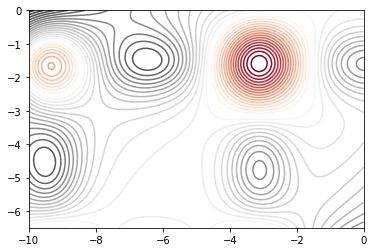

In [33]:
def funcion_objetivo(x_0, x_1):
    '''
    Para la región acotada entre −10<=x_0<=0 y −6.5<=x_1<=0 la función tiene
    múltiples mínimos locales y un único minimo global que se encuentra en
    f(−3.1302468,−1.5821422) = −106.7645367
    '''
    f = np.sin(x_1)*np.exp(1-np.cos(x_0))**2 \
        + np.cos(x_0)*np.exp(1-np.sin(x_1))**2 \
        + (x_0-x_1)**2
    return(f)

# Contour plot función objetivo
x_0 = np.linspace(start = -10, stop = 0, num = 100)
x_1 = np.linspace(start = -6.5, stop = 0, num = 100)
x_0, x_1 = np.meshgrid(x_0, x_1)
z = funcion_objetivo(x_0, x_1)
plt.contour(x_0, x_1, z, 35, cmap='RdGy');

In [34]:
enjambre = Enjambre(
               n_particulas = 50,
               n_variables  = 2,
               limites_inf  = [-10, -6.5],
               limites_sup  = [0, 0],
               verbose      = False
            )

enjambre.optimizar(
    funcion_objetivo = funcion_objetivo,
    optimizacion     = "minimizar",
    n_iteraciones    = 250,
    inercia          = 0.8,
    reduc_inercia    = True,
    inercia_max      = 0.9,
    inercia_min      = 0.4,
    peso_cognitivo   = 1,
    peso_social      = 2,
    parada_temprana  = True,
    rondas_parada    = 5,
    tolerancia_parada = 10**-3,
    verbose          = False
)

Algoritmo detenido en la iteracion 95 por falta cambio absoluto mínimo de 0.001 durante 5 iteraciones consecutivas.
-------------------------------------------
Optimización finalizada 2021-10-22 19:11:31
-------------------------------------------
Duración optimización: 0.383974552154541
Número de iteraciones: 95


In [35]:
enjambre

         Enjambre
Número de partículas: 50
Límites inferiores de cada variable: [-10.   -6.5]
Límites superiores de cada variable: [0 0]
Optimizado: True
Iteraciones optimización: 95

Información mejor partícula:
----------------------------
Mejor posición actual: [-3.1239279812339813 -1.5877945355781136]
Mejor valor actual: -106.78738662182656

Resultados tras optimizar:
----------------------------
Posición óptima: [-3.1227905628082633 -1.5898414186185064]
Valor óptimo: -106.78772515109287

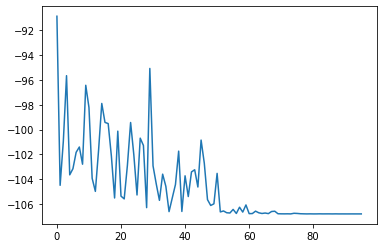

In [36]:
fig = plt.figure(figsize=(6,4))
enjambre.resultados_df['mejor_valor_enjambre'].plot();

In [38]:
import plotly_express as px

def extraer_posicion(particula):
    posicion = particula.posicion
    return(posicion)

lista_df_temp = []

for i in np.arange(len(enjambre.historico_particulas)):
    posiciones = list(map(extraer_posicion, enjambre.historico_particulas[i]))
    df_temp = pd.DataFrame({"iteracion": i, "posicion": posiciones})
    lista_df_temp.append(df_temp)

df_posiciones = pd.concat(lista_df_temp)

df_posiciones[['x_0','x_1']] = pd.DataFrame(df_posiciones["posicion"].values.tolist(),
                                            index= df_posiciones.index)

df_posiciones.head()

,iteracion,posicion,x_0,x_1
0,0,"[-3.5865084057961836, -1.6085174250029715]",-3.586508,-1.608517
1,0,"[-4.0281521680589885, -0.3109929032944203]",-4.028152,-0.310993
2,0,"[-9.085180368959326, -2.4751090754796543]",-9.085180,-2.475109
3,0,"[-2.093342028734706, -5.487439547220772]",-2.093342,-5.487440
4,0,"[-4.791171677919427, -1.9925291165132517]",-4.791172,-1.992529


In [39]:
px.scatter(
    df_posiciones,
    x       = "x_0",
    y       = "x_1",
    range_x = [-10, 0],
    range_y = [-6.5, 0],
    animation_frame = "iteracion"
)

# Hacer una comparación de todos los algoritmos para resolver la instancia de TSP llamada "berlin52"

In [16]:
import numpy as np
berlin52 = np.array([[565,575],[25,185],[345,750],[945,685],[845,655],
            [880,660],[25,230],[525,1000],[580,1175],[650,1130],[1605,620],
            [1220,580],[1465,200],[1530,5],[845,680],[725,370],[145,665],
            [415,635],[510,875],[560,365],[300,465],[520,585],[480,415],
            [835,625],[975,580],[1215,245],[1320,315],[1250,400],[660,180],
            [410,250],[420,555],[575,665],[1150,1160],[700,580],[685,595],
            [685,610],[770,610],[795,645],[720,635],[760,650],[475,960],
            [95,260],[875,920],[700,500],[555,815],[830,485],[1170,65],
            [830,610],[605,625],[595,360],[1340,725],[1740,245]],float)
import math
import random
import matplotlib.pyplot as plt


class City:
    def __init__(self, x, y):
        self.x = x
        self.y = y

    def distance(self, city):
        return math.hypot(self.x - city.x, self.y - city.y)

    def __repr__(self):
        return f"({self.x}, {self.y})"


def read_cities(size):
    cities = []
    with open(f'cities_{size}.data', 'r') as handle:
        lines = handle.readlines()
        for line in lines:
            x, y = map(float, line.split())
            cities.append(City(x, y))
        print(cities)
    return cities


def write_cities_and_return_them(size):
    cities = generate_cities(size)
    with open(f'test_data/cities_{size}.data', 'w+') as handle:
        for city in cities:
            handle.write(f'{city.x} {city.y}\n')
    return cities


def generate_cities(size):
    return [City(x=int(random.random() * 1000), y=int(random.random() * 1000)) for _ in range(size)]


def path_cost(route):
    return sum([city.distance(route[index - 1]) for index, city in enumerate(route)])


def visualize_tsp(title, cities):
    fig = plt.figure()
    fig.suptitle(title)
    x_list, y_list = [], []
    for city in cities:
        x_list.append(city.x)
        y_list.append(city.y)
    x_list.append(cities[0].x)
    y_list.append(cities[0].y)

    plt.plot(x_list, y_list, 'ro')
    plt.plot(x_list, y_list, 'g')
    plt.show(block=True)

## ant system

 > iteration=1, best=12376
 > iteration=2, best=10654
 > iteration=3, best=10425
 > iteration=4, best=9656
 > iteration=5, best=8795
 > iteration=6, best=8795
 > iteration=7, best=8774
 > iteration=8, best=8774
 > iteration=9, best=8774
 > iteration=10, best=8609
 > iteration=11, best=8346
 > iteration=12, best=8346
 > iteration=13, best=8145
 > iteration=14, best=8100
 > iteration=15, best=8100
 > iteration=16, best=8100
 > iteration=17, best=8100
 > iteration=18, best=8100
 > iteration=19, best=8100
 > iteration=20, best=8100
 > iteration=21, best=8100
 > iteration=22, best=8100
 > iteration=23, best=8100
 > iteration=24, best=8100
 > iteration=25, best=8100
 > iteration=26, best=8100
 > iteration=27, best=8100
 > iteration=28, best=8100
 > iteration=29, best=8100
 > iteration=30, best=8100
 > iteration=31, best=8100
 > iteration=32, best=8100
 > iteration=33, best=8093
 > iteration=34, best=8093
 > iteration=35, best=8093
 > iteration=36, best=8093
 > iteration=37, best=8093
 > iter

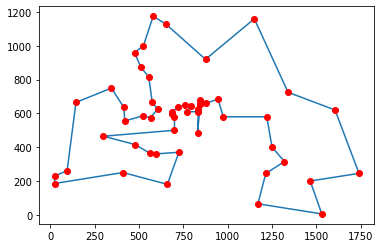

In [8]:
import math
import numpy as np
import matplotlib.pyplot as plt
def euc_2d(c1, c2):
    """returns the rounded Euclidian distance between two 2D points"""
    return round(math.sqrt(sum((c1-c2) ** 2.0)))
    
def cost(permutation, cities):
    """returns the length of a tour of cities"""
    distance = 0
    ncities = len(cities)
    for i in range(ncities):
        c1 = permutation[i]
        if i+1 == ncities:
            c2 = permutation[0]
        else:
            c2 = permutation[i+1]
        distance += euc_2d(cities[c1], cities[c2])
    return distance
def random_permutation(cities):
    """generate a tour as a random permutation of cities"""
    perm = list(range(len(cities)))
    np.random.shuffle(perm)
    return perm
def initialise_pheromone_matrix(num_cities, naive_score):
    """initialises the pheromone matrix"""
    v = num_cities / naive_score
    return v * np.ones(num_cities*num_cities).reshape((num_cities,num_cities))
def calculate_choices(cities, last_city, exclude, pheromone, c_heur, c_hist):
    """calculate the selection probability for a group of cities"""
    choices = []
    for i,coord in enumerate(cities):
        if i in exclude: continue
        prob = {'city' : i}
        prob['history'] = pheromone[last_city, i] ** c_hist
        prob['distance'] = euc_2d(cities[last_city], coord)
        prob['heuristic'] = (1.0 / prob['distance']) ** c_heur
        prob['prob'] = prob['history'] * prob['heuristic']
        choices.append(prob)
    return choices
        
def select_next_city(choices):
    """selects the next city for a partial tour"""
    psum = 0.0
    for element in choices: psum += element['prob']
    if psum == 0.0:
        return choices[np.random.randint(len(choices))]['city']
    v = np.random.random()
    for i,choice in enumerate(choices):
        v -= choice['prob'] / psum
        if v <= 0.0: return choice['city']
    return choices[-1]['city']
def stepwise_const(cities, phero, c_heur, c_hist):
    """construct a tour for an ant"""
    ncities = len(cities)
    perm = []
    perm.append(np.random.randint(ncities))
    while len(perm) < ncities:
        choices = calculate_choices(cities, perm[-1], perm, phero, c_heur, c_hist)
        next_city = select_next_city(choices)
        perm.append(next_city)
    return perm
def decay_pheromone(pheromone, decay_factor):
    """reduce all the pheromone values"""
    factor = 1.0 - decay_factor
    for i in range(len(pheromone)):
        for j in range(len(pheromone[0])):
            pheromone[i, j] *= factor
    
def update_pheromone(pheromone, solutions):
    """increase the pheromone values in the ants tours"""
    for other in solutions:
        for i,x in enumerate(other['vector']):
            if i == len(other['vector'])-1:
                y = other['vector'][0]
            else:
                y = other['vector'][i+1]
            pheromone[x,y] += 1.0 / other['cost']
            pheromone[y,x] += 1.0 / other['cost']
def draw_tour(tour, cities):
    """draws a plot of the tour"""
    xp = [cities[c,0] for c in tour] + [cities[tour[0],0]]
    yp = [cities[c,1] for c in tour] + [cities[tour[0],1]]
    plt.cla()
    plt.plot(xp,yp, xp,yp, 'ro')
    fig.canvas.draw()
    
def ant_system(cities, max_it, num_ants, decay_factor, c_heur, c_hist):
    """implements an Ant System"""
    best = {'vector' : random_permutation(cities)}
    best['cost'] = cost(best['vector'], cities)
    pheromone = initialise_pheromone_matrix(len(cities), best['cost'])
    draw_tour(best['vector'], cities)
    for i in range(max_it):
        solutions = []
        for ant in range(num_ants):
            candidate = {}
            candidate['vector'] = stepwise_const(cities, pheromone, c_heur, c_hist)
            candidate['cost'] = cost(candidate['vector'], cities)
            if candidate['cost'] < best['cost']:
                best = candidate
                draw_tour(best['vector'], cities)
            solutions.append(candidate)
        decay_pheromone(pheromone, decay_factor)
        update_pheromone(pheromone, solutions)
        print(" > iteration=%d, best=%g" % (i+1,best['cost']))
    return best
# problem configuration
# Taken from TSPLIB with Optimal solution = 7542 units
berlin52 = np.array([[565,575],[25,185],[345,750],[945,685],[845,655],
            [880,660],[25,230],[525,1000],[580,1175],[650,1130],[1605,620],
            [1220,580],[1465,200],[1530,5],[845,680],[725,370],[145,665],
            [415,635],[510,875],[560,365],[300,465],[520,585],[480,415],
            [835,625],[975,580],[1215,245],[1320,315],[1250,400],[660,180],
            [410,250],[420,555],[575,665],[1150,1160],[700,580],[685,595],
            [685,610],[770,610],[795,645],[720,635],[760,650],[475,960],
            [95,260],[875,920],[700,500],[555,815],[830,485],[1170,65],
            [830,610],[605,625],[595,360],[1340,725],[1740,245]],float)
# algorithm configuration
max_it = 50 # maximum number of iterations
num_ants = 30  # number of ants
decay_factor = 0.6 # reduction of pheromone
c_heur = 2.5 # heuristic coefficient
c_hist = 1.0 # pheromone coefficient
# execute the algorithm
plt.ion()
fig = plt.figure()
best = ant_system(berlin52, max_it, num_ants, decay_factor, c_heur, c_hist)
print("Done.\nBest Solution: c=%g, v=%s" % (best['cost'], best['vector']))
plt.ioff()
#plt.show()

In [11]:
# The default argument here is useless.
def Recocido(tour1 = []):

    # Make a copy of the list.
    tour1 = tour1[:]

    # Pick a random index.
    izquierda = random.randrange(len(tour1))

    # Unnecessary.
    derecha = 0

    while(True):

        # # Pick another random index
        derecha = random.randrange(len(tour1))

        # If it's not the same index you picked the first time,
        if (derecha != izquierda):

            # swap the elements of the copy at the two indices,
            tour1[izquierda], tour1[derecha] = tour1[derecha], tour1[izquierda]

            # and stop looping.
            break

    return tour1

def Tour(tamaño):
    tour1 = []
    for i in range(tamaño):
        while(not False):
            valor = random.randrange(tamaño)
            if valor not in tour1:
                tour1.append(valor)
                break
    return tour1

def PesoTour(tour1 = [], matriz = [[]]):
    valor = 0
    i = 0
    while(i < len(tour1)):
        if (i == len(tour1) - 1):
            valor = valor + matriz[tour1[i]][tour1[0]]
        else:
            valor = valor + matriz[tour1[i]][tour1[i+1]]
        i += 1
    return valor

tamañoTour = len(berlin52)
inicioTour = []
inicioTour = Tour(tamañoTour)
print(inicioTour)
costoTourInicio = PesoTour(inicioTour, berlin52)
print(costoTourInicio)

nuevoTour = []
temp = 1000000000
#i = 0

while(temp > 0.000000001):
    for j in range(40):

        nuevoTour = Recocido(inicioTour)
        #print(nuevoTour)
        costoNuevoTour = PesoTour(nuevoTour, berlin52)
        #print(costoNuevoTour)
        if (costoNuevoTour < costoTourInicio):
            inicioTour = nuevoTour
            #temp = temp*0.99
        else:
            numero = random.random()
            deltaZ = costoNuevoTour - costoTourInicio
            prob = math.exp(-(deltaZ/temp))
            if (numero < prob):
                inicioTour = nuevoTour
                #temp = temp*0.99

    #i += 1
    temp = temp*0.99

#print(inicioTour)
print(nuevoTour)
#print(costoTourInicio)
print(costoNuevoTour)
#print(i)

[16, 41, 38, 20, 19, 11, 51, 45, 34, 21, 3, 43, 29, 49, 13, 30, 17, 35, 8, 31, 7, 28, 48, 4, 37, 39, 2, 1, 14, 6, 23, 36, 15, 24, 50, 40, 25, 9, 0, 26, 5, 47, 44, 18, 32, 42, 46, 12, 22, 33, 27, 10]


IndexError: index 41 is out of bounds for axis 0 with size 2

In [9]:
n = len(berlin52) #Cambiar n para cambiar el número de ciudades que se desean analizar.

matrizCiudades = berlin52
route = list(range(n))

#se hace la ruta aleatoria.
random.shuffle(route)

#Función para obtener distancia
def get_Dist(rout):
    dis = 0
    for i in range(n):
        if len(route)>i+1:
            dis = dis + matrizCiudades[rout[i]][rout[i+1]]
        else:
            dis = dis + matrizCiudades[rout[-1]][rout[0]]
    return dis

#Función para alterar la ruta aleatoriamente.
def alter_route(rou):
    n1 = random.randint(0,n-1)
    n2 = random.randint(0,n-1)
    while(n1 == n2):
        n2 = random.randint(0,n-1)
    rou[n1],rou[n2] = rou[n2],rou[n1]
    return rou

dist = get_Dist(route)
print(matrizCiudades)
print('La ruta aleatoria:',route,'  Distancia:',dist)

#Se altera la primera ruta y se analiza su disntancia.
route2 = alter_route(routes)
dist2 = get_Dist(route2)

#Se crea un for loop para recorrer si en realidad se puede encontrar una mejor ruta, puse el número 50 debido
#a que es un número al cual no logra llegar ya que el programa se para antes debido a que no encontró
#una mejor ruta.
for i in range(50):    
    if dist2 <= dist:
        print('Nueva ruta:',route2, 'Distancia:',get_Dist(route2))
        route = route2
        dist = dist2
        route2 = alter_route(route)
        dist2 = get_Dist(route2)

IndexError: index 30 is out of bounds for axis 0 with size 2

## Algoritmos geneticos de Mutacion y crossover

In [4]:
import math


def distance(p1, p2):
    dx = p1["x"] - p2["x"]
    dy = p1["y"] - p2["y"]
    return math.sqrt(dx * dx + dy * dy)


def swap(lst, x, y):
    lst[x], lst[y] = lst[y], lst[x]


def next_of_list(lst, index):
    return lst[(index + 1) % len(lst)]


def pre_of_list(lst, index):
    return lst[(index - 1) % len(lst)]

In [5]:
from utils import *
import random
import copy

points = []
dis = []
roulette = []
fitnessValues = []
values = []
population = []
best = []

best_value = None
current_best = {}

mutation_times = 0
current_generation = 0
UNCHANGED_GENS = 0

cities_num = 0

POPULATION_SIZE = 30
CROSSOVER_PROBABILITY = 0.9
MUTATION_PROBABILITY = 0.01
EVOLUTION_TIME = 2048


# 计算城市间的距离
def count_distance():
    global dis
    for i in range(cities_num):
        dis_row = []
        for j in range(cities_num):
            dis_row.append(int(distance(points[i], points[j])))
        dis.append(dis_row)


# 计算解值
def evaluate(individual):
    ind_len = len(individual)
    dis_sum = dis[individual[0]][individual[ind_len - 1]]
    for i in range(1, ind_len):
        dis_sum += dis[individual[i]][individual[i - 1]]
    return dis_sum


# 随机混淆个体
def random_individual(n):
    a = []
    for i in range(n):
        a.append(i)
    random.shuffle(a)
    return a


# 对构建完的轮盘赌序列进行淘汰操作
# 即开始轮盘赌
def wheel_out(rand):
    for i in range(len(roulette)):
        if rand <= roulette[i]:
            return i


# 构建轮盘赌序列
def set_roulette():
    global fitnessValues, roulette

    for i in range(len(fitnessValues)):
        fitnessValues[i] = 1.0 / values[i]
    fv_sum = 0
    for i2 in range(len(fitnessValues)):
        fv_sum += fitnessValues[i2]
    for i3 in range(len(roulette)):
        roulette[i3] = fitnessValues[i3] / fv_sum
    for i4 in range(len(roulette)):
        roulette[i4] += roulette[i4 - 1]


# 获取当前最优值
def get_current_best():
    best_p = 0
    current_best_value = values[0]

    for i in range(1, len(population)):
        if values[i] < current_best_value:
            current_best_value = values[i]
            best_p = i
    return {'best_position': best_p, 'best_value': current_best_value}


# 刷新最优值
def set_best_value():
    global current_best, best_value, best, UNCHANGED_GENS, values

    for i in range(len(population)):
        values[i] = evaluate(population[i])

    current_best = get_current_best()
    if (best_value is None) or (best_value > current_best['best_value']):
        best = copy.deepcopy(population[current_best['best_position']])
        best_value = current_best['best_value']
        UNCHANGED_GENS = 0
    else:
        UNCHANGED_GENS = 1


# 变异方法二（切片变换）
def push_mutate(seq):
    global mutation_times
    mutation_times += 1
    m = 0
    n = 0
    while m >= n:
        m = random.randint(0, (len(seq) >> 1) - 1)
        n = random.randint(0, len(seq) - 1)

    s1 = seq[: m]
    s2 = seq[m: n]
    s3 = seq[n: len(seq)]
    s2[len(s2): len(s2)] = s1
    s2[len(s2): len(s2)] = s3
    return copy.deepcopy(s2)


# 变异方法一（随机对称位变换）
def do_mutate(seq):
    global mutation_times
    mutation_times += 1
    m = 0
    n = 0
    while m >= n:
        m = random.randint(0, (len(seq) - 2) - 1)
        n = random.randint(0, len(seq) - 1)

    j = (n - m + 1) >> 1
    for i in range(j):
        swap(seq, m + i, n - i)
    return seq


# 变异
def mutation():
    for i in range(POPULATION_SIZE):
        if random.random() < MUTATION_PROBABILITY:
            if random.random() > 0.5:
                population[i] = push_mutate(population[i])
            else:
                population[i] = do_mutate(population[i])
            i -= 1


# 获取（产生）进化的子个体
def get_child(pre_or_next, x, y):
    solution = []
    px = copy.deepcopy(population[x])
    py = copy.deepcopy(population[y])
    c = px[random.randint(0, len(px) - 1)]
    solution.append(c)
    while len(px) > 1:
        if pre_or_next is True:
            dx = pre_of_list(px, px.index(c))
            dy = pre_of_list(py, py.index(c))
        else:
            dx = next_of_list(px, px.index(c))
            dy = next_of_list(py, py.index(c))
        px.pop(px.index(c))
        py.pop(py.index(c))
        c = dx if dis[c][dx] < dis[c][dy] else dy
        solution.append(c)
    return solution


# 交叉操作
def do_crossover(x, y):
    child_1 = get_child(False, x, y)
    child_2 = get_child(True, x, y)
    population[x] = child_1
    population[y] = child_2


# 交叉
def crossover():
    queue = []
    for k in range(POPULATION_SIZE):
        if random.random() < CROSSOVER_PROBABILITY:
            queue.append(k)
    random.shuffle(queue)
    for i in range(0, len(queue) - 1, 2):
        do_crossover(queue[i], queue[i + 1])


# 选择
def selection():
    global population
    parents = []
    init_num = 4
    parents.append(population[current_best['best_position']])
    parents.append(do_mutate(copy.deepcopy(best)))
    parents.append(push_mutate(copy.deepcopy(best)))
    parents.append(copy.deepcopy(best))

    set_roulette()
    for i in range(init_num, POPULATION_SIZE):
        parents.append(population[wheel_out(random.random())])
    population = parents


def next_generation():
    global current_generation
    current_generation += 1
    selection()
    crossover()
    mutation()
    set_best_value()


def initialize():
    global values, fitnessValues, roulette, cities_num
    cities_num = len(points)
    count_distance()
    for i in range(POPULATION_SIZE):
        population.append(random_individual(cities_num))
    values = fitnessValues = roulette = [0] * POPULATION_SIZE
    set_best_value()


def init_data():
    global points
    points = [
        {"x": 565, "y": 575},
        {"x": 25, "y": 185},
        {"x": 345, "y": 750},
        {"x": 945, "y": 685},
        {"x": 845, "y": 655},
        {"x": 880, "y": 660},
        {"x": 25, "y": 230},
        {"x": 525, "y": 1000},
        {"x": 580, "y": 1175},
        {"x": 650, "y": 1130},
        {"x": 1605, "y": 620},
        {"x": 1220, "y": 580},
        {"x": 1465, "y": 200},
        {"x": 1530, "y": 5},
        {"x": 845, "y": 680},
        {"x": 725, "y": 370},
        {"x": 145, "y": 665},
        {"x": 415, "y": 635},
        {"x": 510, "y": 875},
        {"x": 560, "y": 365},
        {"x": 300, "y": 465},
        {"x": 520, "y": 585},
        {"x": 480, "y": 415},
        {"x": 835, "y": 625},
        {"x": 975, "y": 580},
        {"x": 1215, "y": 245},
        {"x": 1320, "y": 315},
        {"x": 1250, "y": 400},
        {"x": 660, "y": 180},
        {"x": 410, "y": 250},
        {"x": 420, "y": 555},
        {"x": 575, "y": 665},
        {"x": 1150, "y": 1160},
        {"x": 700, "y": 580},
        {"x": 685, "y": 595},
        {"x": 685, "y": 610},
        {"x": 770, "y": 610},
        {"x": 795, "y": 645},
        {"x": 720, "y": 635},
        {"x": 760, "y": 650},
        {"x": 475, "y": 960},
        {"x": 95, "y": 260},
        {"x": 875, "y": 920},
        {"x": 700, "y": 500},
        {"x": 555, "y": 815},
        {"x": 830, "y": 485},
        {"x": 1170, "y": 65},
        {"x": 830, "y": 610},
        {"x": 605, "y": 625},
        {"x": 595, "y": 360},
        {"x": 1340, "y": 725},
        {"x": 1740, "y": 245}
    ]


if __name__ == '__main__':
    print('Init...')
    init_data()
    initialize()
    print('Start GA TSP...')
    while EVOLUTION_TIME > 0:
        next_generation()
        EVOLUTION_TIME -= 1
        print(best_value)
    print('End...')

Init...
Start GA TSP...
22288
18624
15556
14521
13192
12460
11328
10473
10473
9747
9747
9747
9747
9747
9747
9747
9747
9629
8943
8943
8943
8943
8743
8634
8634
8550
8183
8183
8183
8120
8120
8101
8101
8101
8101
8101
8101
8101
8101
8101
8101
8083
8027
8027
8027
8027
8027
8027
8027
7955
7955
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7938
7937
7937
7937
7937
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
7929
79

## Simulated anneling

[(565.0, 575.0), (25.0, 185.0), (345.0, 750.0), (945.0, 685.0), (845.0, 655.0), (880.0, 660.0), (25.0, 230.0), (525.0, 1000.0), (580.0, 1175.0), (650.0, 1130.0), (1605.0, 620.0), (1220.0, 580.0), (1465.0, 200.0), (1530.0, 5.0), (845.0, 680.0), (725.0, 370.0), (145.0, 665.0), (415.0, 635.0), (510.0, 875.0), (560.0, 365.0), (300.0, 465.0), (520.0, 585.0), (480.0, 415.0), (835.0, 625.0), (975.0, 580.0), (1215.0, 245.0), (1320.0, 315.0), (1250.0, 400.0), (660.0, 180.0), (410.0, 250.0), (420.0, 555.0), (575.0, 665.0), (1150.0, 1160.0), (700.0, 580.0), (685.0, 595.0), (685.0, 610.0), (770.0, 610.0), (795.0, 645.0), (720.0, 635.0), (760.0, 650.0), (475.0, 960.0), (95.0, 260.0), (875.0, 920.0), (700.0, 500.0), (555.0, 815.0), (830.0, 485.0), (1170.0, 65.0), (830.0, 610.0), (605.0, 625.0), (595.0, 360.0), (1340.0, 725.0), (1740.0, 245.0)]
Best fitness obtained:  7973.354444406508


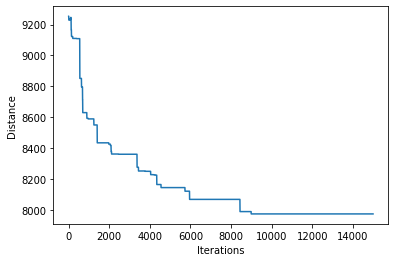

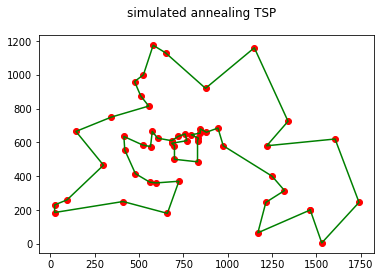

In [17]:
import math
import random
import matplotlib.pyplot as plt


class SimAnneal(object):
    def __init__(self, cities, temperature=-1, alpha=-1, stopping_temperature=-1, stopping_iter=-1):
        self.cities = cities
        self.num_cities = len(cities)
        self.temperature = math.sqrt(self.num_cities) if temperature == -1 else temperature
        self.T_save = self.temperature
        self.alpha = 0.999 if alpha == -1 else alpha
        self.stopping_temperature = 1e-8 if stopping_temperature == -1 else stopping_temperature
        self.stopping_iter = 100000 if stopping_iter == -1 else stopping_iter
        self.iteration = 1
        self.route = None
        self.best_fitness = float("Inf")
        self.progress = []
        self.cur_cost = None

    def greedy_solution(self):
        start_node = random.randint(0, self.num_cities)  # start from a random node
        unvisited = self.cities[:]
        del unvisited[start_node]
        route = [cities[start_node]]
        while len(unvisited):
            index, nearest_city = min(enumerate(unvisited), key=lambda item: item[1].distance(route[-1]))
            route.append(nearest_city)
            del unvisited[index]
        current_cost = path_cost(route)
        self.progress.append(current_cost)
        return route, current_cost

    def accept_probability(self, candidate_fitness):
        return math.exp(-abs(candidate_fitness - self.cur_cost) / self.temperature)

    def accept(self, guess):
        guess_cost = path_cost(guess)
        if guess_cost < self.cur_cost:
            self.cur_cost, self.route = guess_cost, guess
            if guess_cost < self.best_fitness:
                self.best_fitness, self.route = guess_cost, guess
        else:
            if random.random() < self.accept_probability(guess_cost):
                self.cur_cost, self.route = guess_cost, guess

    def run(self):
        self.route, self.cur_cost = self.greedy_solution()
        while self.temperature >= self.stopping_temperature and self.iteration < self.stopping_iter:
            guess = list(self.route)
            left_index = random.randint(2, self.num_cities - 1)
            right_index = random.randint(0, self.num_cities - left_index)
            guess[right_index: (right_index + left_index)] = reversed(guess[right_index: (right_index + left_index)])
            self.accept(guess)
            self.temperature *= self.alpha
            self.iteration += 1
            self.progress.append(self.cur_cost)

        print("Best fitness obtained: ", self.best_fitness)

    def visualize_routes(self):
        visualize_tsp('simulated annealing TSP', self.route)

    def plot_learning(self):
        fig = plt.figure(1)
        plt.plot([i for i in range(len(self.progress))], self.progress)
        plt.ylabel("Distance")
        plt.xlabel("Iterations")
        plt.show(block=False)


if __name__ == "__main__":
    cities = read_cities(52)
    # cities = berlin52
    sa = SimAnneal(cities, stopping_iter=15000)
    sa.run()
    sa.plot_learning()
    sa.visualize_routes()

## Greedy Algorithm

[(565.0, 575.0), (25.0, 185.0), (345.0, 750.0), (945.0, 685.0), (845.0, 655.0), (880.0, 660.0), (25.0, 230.0), (525.0, 1000.0), (580.0, 1175.0), (650.0, 1130.0), (1605.0, 620.0), (1220.0, 580.0), (1465.0, 200.0), (1530.0, 5.0), (845.0, 680.0), (725.0, 370.0), (145.0, 665.0), (415.0, 635.0), (510.0, 875.0), (560.0, 365.0), (300.0, 465.0), (520.0, 585.0), (480.0, 415.0), (835.0, 625.0), (975.0, 580.0), (1215.0, 245.0), (1320.0, 315.0), (1250.0, 400.0), (660.0, 180.0), (410.0, 250.0), (420.0, 555.0), (575.0, 665.0), (1150.0, 1160.0), (700.0, 580.0), (685.0, 595.0), (685.0, 610.0), (770.0, 610.0), (795.0, 645.0), (720.0, 635.0), (760.0, 650.0), (475.0, 960.0), (95.0, 260.0), (875.0, 920.0), (700.0, 500.0), (555.0, 815.0), (830.0, 485.0), (1170.0, 65.0), (830.0, 610.0), (605.0, 625.0), (595.0, 360.0), (1340.0, 725.0), (1740.0, 245.0)]


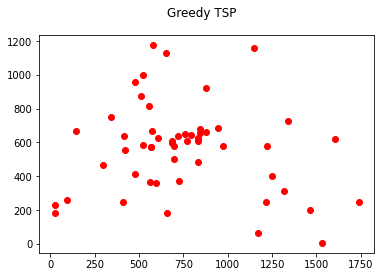

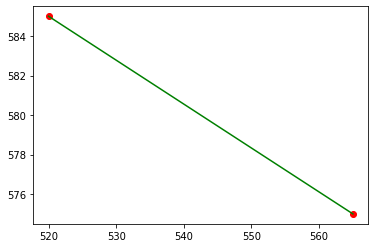

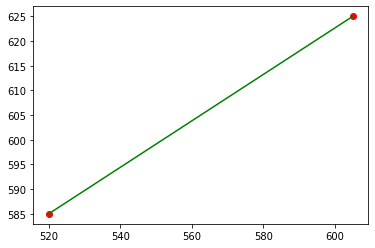

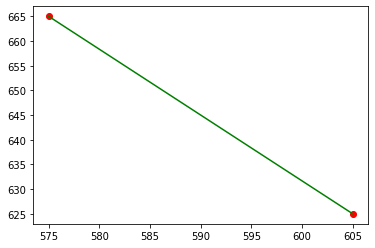

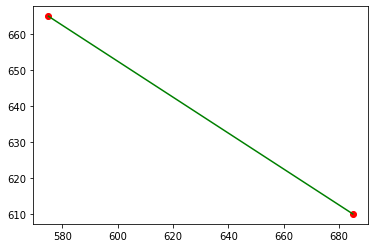

...

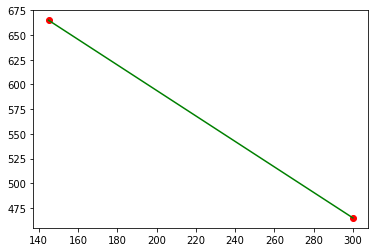

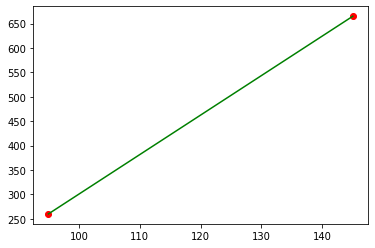

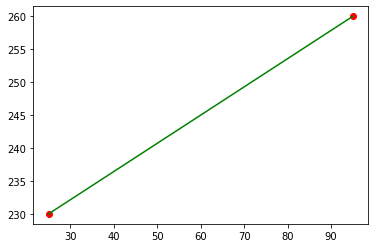

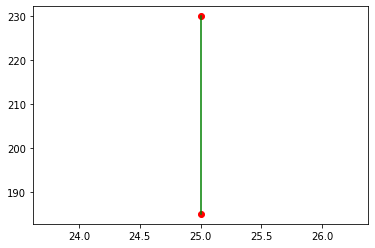

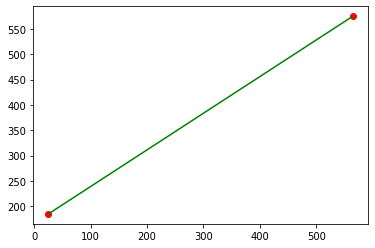

8980.91827932919
[(565.0, 575.0), (520.0, 585.0), (605.0, 625.0), (575.0, 665.0), (685.0, 610.0), (685.0, 595.0), (700.0, 580.0), (720.0, 635.0), (760.0, 650.0), (795.0, 645.0), (770.0, 610.0), (830.0, 610.0), (835.0, 625.0), (845.0, 655.0), (845.0, 680.0), (880.0, 660.0), (945.0, 685.0), (975.0, 580.0), (830.0, 485.0), (700.0, 500.0), (725.0, 370.0), (595.0, 360.0), (560.0, 365.0), (480.0, 415.0), (420.0, 555.0), (415.0, 635.0), (345.0, 750.0), (510.0, 875.0), (555.0, 815.0), (475.0, 960.0), (525.0, 1000.0), (650.0, 1130.0), (580.0, 1175.0), (875.0, 920.0), (1150.0, 1160.0), (1340.0, 725.0), (1220.0, 580.0), (1250.0, 400.0), (1320.0, 315.0), (1215.0, 245.0), (1170.0, 65.0), (1465.0, 200.0), (1530.0, 5.0), (1740.0, 245.0), (1605.0, 620.0), (660.0, 180.0), (410.0, 250.0), (300.0, 465.0), (145.0, 665.0), (95.0, 260.0), (25.0, 230.0), (25.0, 185.0)]


In [19]:
import matplotlib.pyplot as plt


class Greedy:
    def __init__(self, cities):
        self.unvisited = cities[1:]
        self.route = [cities[0]]

    def run(self, plot):
        if plot:
            plt.ion()
            plt.show(block=False)
            self.init_plot()
        while len(self.unvisited):
            index, nearest_city = min(enumerate(self.unvisited),
                                      key=lambda item: item[1].distance(self.route[-1]))
            self.route.append(nearest_city)
            del self.unvisited[index]
            self.plot_interactive(False)
        self.route.append(self.route[0])
        self.plot_interactive(False)
        self.route.pop()
        return path_cost(self.route)

    def plot_interactive(self, block):
        x1, y1, x2, y2 = self.route[-2].x, self.route[-2].y, self.route[-1].x, self.route[-1].y
        plt.plot([x1, x2], [y1, y2], 'ro')
        plt.plot([x1, x2], [y1, y2], 'g')
        plt.draw()
        plt.pause(0.07)
        plt.show(block=block)

    def init_plot(self):
        fig = plt.figure(0)
        fig.suptitle('Greedy TSP')
        x_list, y_list = [], []
        for city in [*self.route, *self.unvisited]:
            x_list.append(city.x)
            y_list.append(city.y)
        x_list.append(self.route[0].x)
        y_list.append(self.route[0].y)

        plt.plot(x_list, y_list, 'ro')
        plt.show(block=False)


if __name__ == "__main__":
    cities = read_cities(52)
    greedy = Greedy(cities)

    print(greedy.run(plot=True))
    print(greedy.route)
    plt.show(block=True)

## PSO

[(565.0, 575.0), (25.0, 185.0), (345.0, 750.0), (945.0, 685.0), (845.0, 655.0), (880.0, 660.0), (25.0, 230.0), (525.0, 1000.0), (580.0, 1175.0), (650.0, 1130.0), (1605.0, 620.0), (1220.0, 580.0), (1465.0, 200.0), (1530.0, 5.0), (845.0, 680.0), (725.0, 370.0), (145.0, 665.0), (415.0, 635.0), (510.0, 875.0), (560.0, 365.0), (300.0, 465.0), (520.0, 585.0), (480.0, 415.0), (835.0, 625.0), (975.0, 580.0), (1215.0, 245.0), (1320.0, 315.0), (1250.0, 400.0), (660.0, 180.0), (410.0, 250.0), (420.0, 555.0), (575.0, 665.0), (1150.0, 1160.0), (700.0, 580.0), (685.0, 595.0), (685.0, 610.0), (770.0, 610.0), (795.0, 645.0), (720.0, 635.0), (760.0, 650.0), (475.0, 960.0), (95.0, 260.0), (875.0, 920.0), (700.0, 500.0), (555.0, 815.0), (830.0, 485.0), (1170.0, 65.0), (830.0, 610.0), (605.0, 625.0), (595.0, 360.0), (1340.0, 725.0), (1740.0, 245.0)]
initial cost is 8980.91827932919


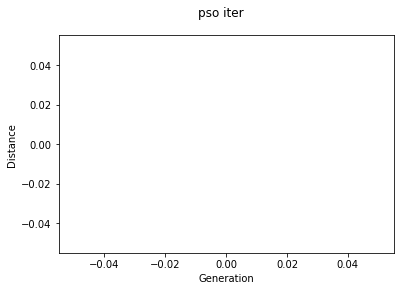

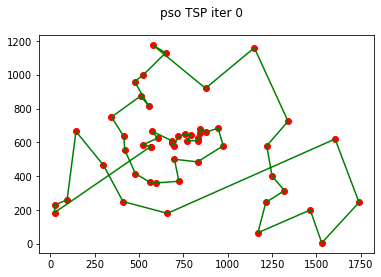

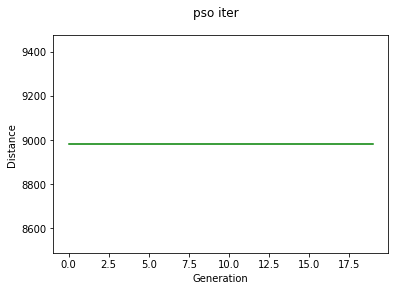

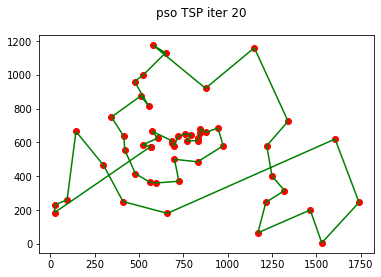

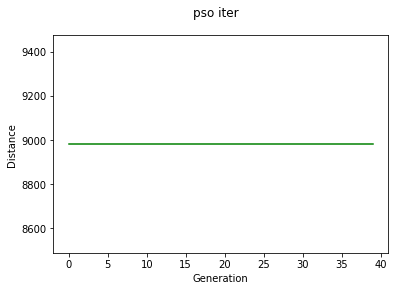

...

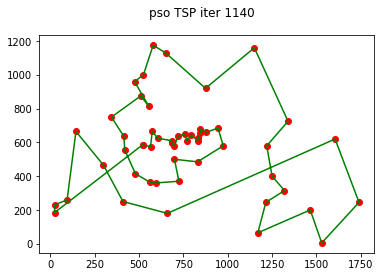

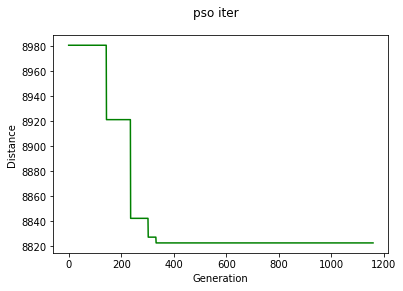

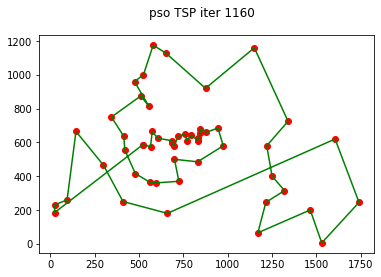

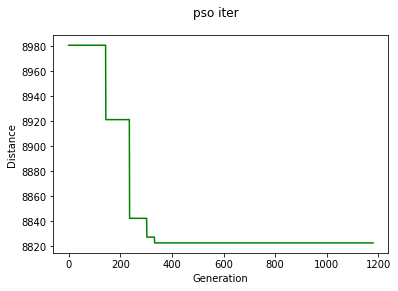

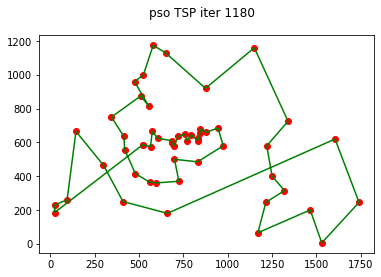

cost: 8822.552712025858	| gbest: [(520.0, 585.0), (565.0, 575.0), (575.0, 665.0), (605.0, 625.0), (685.0, 610.0), (685.0, 595.0), (700.0, 580.0), (720.0, 635.0), (760.0, 650.0), (770.0, 610.0), (795.0, 645.0), (830.0, 610.0), (835.0, 625.0), (845.0, 655.0), (845.0, 680.0), (880.0, 660.0), (945.0, 685.0), (975.0, 580.0), (830.0, 485.0), (700.0, 500.0), (725.0, 370.0), (595.0, 360.0), (560.0, 365.0), (480.0, 415.0), (420.0, 555.0), (415.0, 635.0), (345.0, 750.0), (510.0, 875.0), (555.0, 815.0), (475.0, 960.0), (525.0, 1000.0), (580.0, 1175.0), (650.0, 1130.0), (875.0, 920.0), (1150.0, 1160.0), (1340.0, 725.0), (1220.0, 580.0), (1250.0, 400.0), (1320.0, 315.0), (1215.0, 245.0), (1170.0, 65.0), (1465.0, 200.0), (1530.0, 5.0), (1740.0, 245.0), (1605.0, 620.0), (660.0, 180.0), (410.0, 250.0), (300.0, 465.0), (145.0, 665.0), (95.0, 260.0), (25.0, 230.0), (25.0, 185.0)]


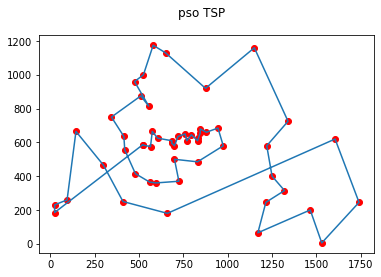

In [20]:
import random
import math
import matplotlib.pyplot as plt


class Particle:
    def __init__(self, route, cost=None):
        self.route = route
        self.pbest = route
        self.current_cost = cost if cost else self.path_cost()
        self.pbest_cost = cost if cost else self.path_cost()
        self.velocity = []

    def clear_velocity(self):
        self.velocity.clear()

    def update_costs_and_pbest(self):
        self.current_cost = self.path_cost()
        if self.current_cost < self.pbest_cost:
            self.pbest = self.route
            self.pbest_cost = self.current_cost

    def path_cost(self):
        return path_cost(self.route)


class PSO:

    def __init__(self, iterations, population_size, gbest_probability=1.0, pbest_probability=1.0, cities=None):
        self.cities = cities
        self.gbest = None
        self.gcost_iter = []
        self.iterations = iterations
        self.population_size = population_size
        self.particles = []
        self.gbest_probability = gbest_probability
        self.pbest_probability = pbest_probability

        solutions = self.initial_population()
        self.particles = [Particle(route=solution) for solution in solutions]

    def random_route(self):
        return random.sample(self.cities, len(self.cities))

    def initial_population(self):
        random_population = [self.random_route() for _ in range(self.population_size - 1)]
        greedy_population = [self.greedy_route(0)]
        return [*random_population, *greedy_population]
        # return [*random_population]

    def greedy_route(self, start_index):
        unvisited = self.cities[:]
        del unvisited[start_index]
        route = [self.cities[start_index]]
        while len(unvisited):
            index, nearest_city = min(enumerate(unvisited), key=lambda item: item[1].distance(route[-1]))
            route.append(nearest_city)
            del unvisited[index]
        return route

    def run(self):
        self.gbest = min(self.particles, key=lambda p: p.pbest_cost)
        print(f"initial cost is {self.gbest.pbest_cost}")
        plt.ion()
        plt.draw()
        for t in range(self.iterations):
            self.gbest = min(self.particles, key=lambda p: p.pbest_cost)
            if t % 20 == 0:
                plt.figure(0)
                plt.plot(pso.gcost_iter, 'g')
                plt.ylabel('Distance')
                plt.xlabel('Generation')
                fig = plt.figure(0)
                fig.suptitle('pso iter')
                x_list, y_list = [], []
                for city in self.gbest.pbest:
                    x_list.append(city.x)
                    y_list.append(city.y)
                x_list.append(pso.gbest.pbest[0].x)
                y_list.append(pso.gbest.pbest[0].y)
                fig = plt.figure(1)
                fig.clear()
                fig.suptitle(f'pso TSP iter {t}')

                plt.plot(x_list, y_list, 'ro')
                plt.plot(x_list, y_list, 'g')
                plt.draw()
                plt.pause(.001)
            self.gcost_iter.append(self.gbest.pbest_cost)

            for particle in self.particles:
                particle.clear_velocity()
                temp_velocity = []
                gbest = self.gbest.pbest[:]
                new_route = particle.route[:]

                for i in range(len(self.cities)):
                    if new_route[i] != particle.pbest[i]:
                        swap = (i, particle.pbest.index(new_route[i]), self.pbest_probability)
                        temp_velocity.append(swap)
                        new_route[swap[0]], new_route[swap[1]] = \
                            new_route[swap[1]], new_route[swap[0]]

                for i in range(len(self.cities)):
                    if new_route[i] != gbest[i]:
                        swap = (i, gbest.index(new_route[i]), self.gbest_probability)
                        temp_velocity.append(swap)
                        gbest[swap[0]], gbest[swap[1]] = gbest[swap[1]], gbest[swap[0]]

                particle.velocity = temp_velocity

                for swap in temp_velocity:
                    if random.random() <= swap[2]:
                        new_route[swap[0]], new_route[swap[1]] = \
                            new_route[swap[1]], new_route[swap[0]]

                particle.route = new_route
                particle.update_costs_and_pbest()


if __name__ == "__main__":
    cities = read_cities(52)
    pso = PSO(iterations=1200, population_size=300, pbest_probability=0.9, gbest_probability=0.02, cities=cities)
    pso.run()
    print(f'cost: {pso.gbest.pbest_cost}\t| gbest: {pso.gbest.pbest}')

    x_list, y_list = [], []
    for city in pso.gbest.pbest:
        x_list.append(city.x)
        y_list.append(city.y)
    x_list.append(pso.gbest.pbest[0].x)
    y_list.append(pso.gbest.pbest[0].y)
    fig = plt.figure(1)
    fig.suptitle('pso TSP')

    plt.plot(x_list, y_list, 'ro')
    plt.plot(x_list, y_list)
    plt.show(block=True)

## Hill Climbing

In [21]:
import string, math
def distancesFromCoords():
    f = open('berlin52.tsp') 
    data = [line.replace("\n","").split(" ")[1:] for line in f.readlines()[6:58]]# lee el data set y lo guard aen data
    coords =  list(map(lambda x: [float(x[0]),float(x[1])], data)) #crea una lista del mapeado del data, obteniendo las coordenadas
    distances = []#lista para almacenar las distancias
    for i in range(len(coords)):
        row = [] 
        for j in range(len(coords)):
            row.append(math.sqrt((coords[i][0]-coords[j][0])**2 + (coords[i][1]-coords[j][1])**2))#raid de la distancia anterior con la siguiente
        distances.append(row) 
    return distances

In [22]:
import numpy as np
import random as r

def ObjetiveFunction(pos,matriz):
    d = 0
    for i in range(len(pos)-1):
        d += matriz[pos[i]][pos[i+1]]#suma de la distancias anterior con la siguiente
    return d

def NewPosition(x):#creacion de rutas aleatorias
    x1 = r.randint(1,len(x)-2)
    x2 = r.randint(1,len(x)-2)
    while(x2==x1):#verificacion de no revisar el mismo punto
        x2 = r.randint(1,len(x)-2)
    aux = x[x1]
    x[x1] = x[x2]
    x[x2] = aux
    return x

if __name__ == "__main__":
    coor = distancesFromCoords() #coordenadas
    x = [] 
    pos = r.randint(0,len(coor)-1) #primera posicion random 
    x.append(pos) #posicion inicial cualquiera
    for i in range(len(coor)):
        if(i!=pos):
            x.append(i) 
    x.append(pos) #guardar el resto de posiciones
    new_d = 0 #nueva distancia
     #Numero de iteraciones ideal para encontrar la mejor ruta
    i = 44000

    while(i>0):
        d = ObjetiveFunction(x,coor)#distancia actual
        new_x = NewPosition(x[:]) #generador de nueva posición aleatoria
        new_d = ObjetiveFunction(new_x,coor)#generador de nueva distancia
        if(new_d<d): #entonces comparamos , sí la nueva distancia es menos a la anterior
            x = new_x #sí es así , la posición anterior cambiaría por la nueva
        i -= 1 #decremento 

    print("Route:",x)
    print("Final distance:",new_d)

Route: [0, 18, 7, 40, 2, 16, 6, 1, 41, 20, 15, 25, 27, 11, 50, 42, 48, 21, 30, 17, 31, 44, 8, 9, 32, 10, 51, 13, 28, 29, 22, 19, 49, 43, 33, 38, 39, 37, 47, 23, 4, 14, 5, 3, 24, 36, 35, 34, 26, 12, 46, 45, 0]
Final distance: 13231.150130346561


## Naive

In [47]:
import random

def read_instance(path):
    """Reads a TSPLIB-formatted TSP instance (not tour) file. """
    coordinates = []
    with open(f'berlin52.tsp', 'r') as f:
        for line in f:
            if "NODE_COORD_SECTION" in line:
                break
        for line in f:
            line = line.strip()
            if "EOF" in line or not line:
                break
            fields = line.strip().split()
            coordinates.append((float(fields[1]), float(fields[2])))
    return coordinates

def read_tour(path):
    """Reads a TSPLIB-formatted TSP tour file. """
    tour = []
    with open(f'berlin52.tsp', 'r') as f:
        for line in f:
            if "TOUR_SECTION" in line:
                break
        for line in f:
            line = line.strip()
            if "-1" in line or "EOF" in line or not line:
                break
            fields = line.strip().split()
            tour.append((int(fields[0])))
    return tour

def distance(instance, i, j):
    """instance is a list of points. each point is a pair of coordinates x, y.
    i and j identify points in the list as indices.
    """
    ix = instance[i][0]
    iy = instance[i][1]
    jx = instance[j][0]
    jy = instance[j][1]
    dx = jx - ix
    dy = jy - iy
    return round((dx ** 2 + dy ** 2) ** 0.5)

def make_edge(instance, i, j):
    """instance is a list of points. each point is a pair of coordinates x, y.
    i and j identify points in the list as indices.
    returns tuple of cost + random integer (to get random ordering of same-cost edges) and i, j in normalized order.
    """
    return ((distance(instance, i, j), random.randint(0, len(instance))), min(i, j), max(i, j))

def make_sorted_edges(instance):
    """instance is a list of points. each point is a pair of coordinates x, y.
    returns all possible edges sorted by cost. complexity is at least O(n**2 * log(n**2))
    """
    edges = []
    for i in range(len(instance)):
        for j in range(i + 1, len(instance)):
            edges.append(make_edge(instance, i, j))
    edges.sort()
    return edges

def mst(instance):
    """Returns MST for given instance.
    """
    sorted_edges = make_sorted_edges(instance)
    sets = []
    edges = []
    for e in sorted_edges:
        # determine which edge sets this new edge belongs to.
        found = []
        cyclic = False
        for i in range(len(sets)):
            if e[1] in sets[i] and e[2] in sets[i]:
                cyclic = True
                break
            elif e[1] in sets[i] or e[2] in sets[i]:
                found.append(i)
        if cyclic:
            continue
        assert(len(found) <= 2)

        # create new set, add to existing, or merge 2 existing.
        if len(found) == 0:
            sets.append(set())
            sets[-1].add(e[1])
            sets[-1].add(e[2])
        elif len(found) == 1:
            sets[found[0]].add(e[1])
            sets[found[0]].add(e[2])
        elif len(found) == 2:
            sets[found[0]].update(sets[found[1]])
            sets.pop(found[1])
        edges.append(e)

        # end if all points included.
        if len(edges) == len(instance):
            break

    # check result.
    check = set()
    for e in edges:
        check.add(e[1])
        check.add(e[2])
    assert(len(check) == len(instance))

    return edges

from matplotlib import pyplot as plt

def plot_edges(instance, edges, color='b'):
    for e in edges:
        p1 = instance[e[1]]
        p2 = instance[e[2]]
        plt.plot([p1[0], p2[0]], [p1[1], p2[1]], f"{color}x-")

def plot_tour(instance, tour):
    x = []
    y = []
    for i in tour:
        p = instance[i - 1]
        x.append(p[0])
        y.append(p[1])
    plt.plot(x, y, "rx:")

def plot_diff(instance, tour, mst_edges):
    tour_edges = set()
    print(tour)
    prev = tour[-1]
    for i in tour:
        tour_edges.add((min(i - 1, prev - 1), max(i - 1, prev - 1)))
        prev = i
    mst_edges_ = set()
    for e in mst_edges:
        mst_edges_.add((e[1], e[2]))
    adds = set()
    for e in mst_edges_:
        if e not in tour_edges:
            adds.add(e)
    dels = set()
    for e in tour_edges:
        if e not in mst_edges_:
            dels.add(e)

    for e in adds:
        p1 = instance[e[0]]
        p2 = instance[e[1]]
        plt.plot([p1[0], p2[0]], [p1[1], p2[1]], f"rx-")
    for e in dels:
        p1 = instance[e[0]]
        p2 = instance[e[1]]
        plt.plot([p1[0], p2[0]], [p1[1], p2[1]], f"rx:")


import sys

if __name__ == "__main__":
    instance_file = sys.argv[1]
    tour_file = sys.argv[2]

    instance = read_instance(instance_file)
    tour = read_tour(tour_file)

    edges = mst(instance)
    total = sum([x[0][0] for x in edges])
    print(f'total cost: {total}')

total cost: 6078


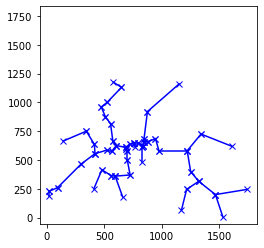

In [49]:
    plot_edges(instance, edges)
    plot_tour(instance, tour)

    # plot_diff(instance, tour, edges)

    plt.axis('square')
    plt.show()

## Comparativa

De los algoritmos utilizados en esta seccion nosotros podemos observar que todos ellos han podido resolver el problema en su propia manera. De los algoritmos que se utilizaron en esta seccion es importante mencionar que los mas rapidos serian hill climbing y Naive en terminos de tiempo de corrida, sin embargo, estos no dan los mejores resultados. En terminos de excelentes resultados nosotros podemos observar que PSO y ant-system tuvieron los mejores resultados, pero estos son relativamente lentos, ya que toman alrededor de 5 segundos de tiempo de procesamiento.

Nosotros como equipo decidimos que aunque tome 5 segundos resolver el problema, la calidad que se obtiene es muy buena como para ser ignorada, por lo que se recomiendan los algoritmos de ant-system y pso para este problema y son indudablemente los mejores. Esto no signfica que los otros algoritmos no tienen sus ventajas, ya que estos han logrado obtener una solucion satisfactoria, pero ant-system y pso obtuvieron excelentes resultados en un tiempo aceptable. Los algoritmos geneticos fueron tambien excelentes para este trabajo, pero creemos que los resultados de pso y ant-system son un poco mas satisfatorios.

Se concluye diciendo que los algoritmos geneticos, ant-system y pso son los que tienen mejores resultados con ant-system teniendo un poco mejores resultados que pso, pero no existe una gran diferencia entre estos. Naive y hill climbing son excelentes cuando se demanda mayor velocidad y no tanta precision en la respuesta.

# Parte 5: Conclusiones Individuales 

**Patrick Galán Cárdenas:** 

**Jaime Guzmán Parada:** En este trabajo se concluyó todo el aprendizaje de la clase utilizando los diferentes algoritmos que vimos en el problema TSP con la aplicación de cada uno de los algoritmos. Las lecciones que se tomaron de este curso son muy valiosas, ya que pudimos encontrar los diferentes usos para estos algoritmos, al igual que una aplicación práctica de los mismos. Se logro encontrar que los algoritmos genéticos tienen un gran potencial para poder resolver los problemas, sin embargo, estos no son muy populares el día de hoy a comparación de Deep Learning. Se cree que en el futuro estos algoritmos serán la base de la respuesta a muchos problemas.

En este trabajo se implementa con mejor uso el algoritmo de PSO y ant-system, algoritmos que no se habían explorado tanto en actividades pasadas. Estos tuvieron gran excito en su competencia contra los otros algoritmos que ya habíamos programado y nos dan una excelente respuesta en el problema de berlin52 de TSPLIB. La implementación de estos algoritmos nos permitió observar sus ventajas y desventajas, al igual que darnos la oportunidad de observar el código funcionando y modificando el mismo. Podemos terminar diciendo que este trabajo, al igual que la clase, nos deja con una excelente lección sobre los algoritmos genéticos y los que simulan la naturaleza de los animales. Se obtiene el conocimiento de la función de los mismos algoritmos, al igual que la idea de que estos pueden llegar a remplazar las técnicas que se usan el día de hoy en muchos problemas de ML.

**Luis Leopoldo Jiménez Pérez:** 

**Héctor San Román Caraza:** 